<a href="https://colab.research.google.com/github/TheCaveOfAdullam/study3/blob/main/schoolSafety_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
%matplotlib inline

import matplotlib as mpl  # 기본 설정
import matplotlib.pyplot as plt  # 그래프 그리기
import matplotlib.font_manager as fm  # 폰트 관리


!apt-get update -qq         # apt-get 패키지 설치 명령어, -qq : 에러외 메세지 숨기기
!apt-get install fonts-nanum* -qq #나눔글꼴 설치

fe = fm.FontEntry(fname=r'/usr/share/fonts/truetype/nanum/NanumGothic.ttf', name='NanumGothic') #파일 저장되어있는 경로와 이름 설정
fm.fontManager.ttflist.insert(0, fe)  # Matplotlib에 폰트 추가
plt.rcParams.update({'font.size': 10, 'font.family': 'NanumGothic'}) #폰트설정

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Selecting previously unselected package fonts-nanum.
(Reading database ... 123586 files and directories currently installed.)
Preparing to unpack .../fonts-nanum_20200506-1_all.deb ...
Unpacking fonts-nanum (20200506-1) ...
Selecting previously unselected package fonts-nanum-coding.
Preparing to unpack .../fonts-nanum-coding_2.5-3_all.deb ...
Unpacking fonts-nanum-coding (2.5-3) ...
Selecting previously unselected package fonts-nanum-eco.
Preparing to unpack .../fonts-nanum-eco_1.000-7_all.deb ...
Unpacking fonts-nanum-eco (1.000-7) ...
Selecting previously unselected package fonts-nanum-extra.
Preparing to unpack .../fonts-nanum-extra_20200506-1_all.deb ...
Unpacking fonts-nanum-extra (20200506-1) ...
Setting up fonts-nanum-extra (20200506-1) ...
Setting up fonts-nanum (20200506-1) ...
Setting up fo

In [4]:
# 음수 깨짐 해결
mpl.rcParams['axes.unicode_minus'] = False

In [5]:
# 레티나 설정을 해주면 글씨가 좀 더 선명하게 보입니다.
# 폰트의 주변이 흐릿하게 보이는 것을 방지합니다.
%config InlineBackend.figure_format = 'retina'

In [6]:
# 엑셀 파일 로드
file_path = '/content/drive/MyDrive/data/★2019~2023 학교안전사고 데이터_수정.xlsx'
data_2019 = pd.read_excel(file_path, sheet_name='2019')
data_2020 = pd.read_excel(file_path, sheet_name='2020')
data_2021 = pd.read_excel(file_path, sheet_name='2021')
data_2022 = pd.read_excel(file_path, sheet_name='2022')
data_2023 = pd.read_excel(file_path, sheet_name='2023')

In [7]:
# 각 연도의 데이터에 'Year' 컬럼 추가
data_2019['Year'] = 2019
data_2020['Year'] = 2020
data_2021['Year'] = 2021
data_2022['Year'] = 2022
data_2023['Year'] = 2023

In [8]:
# 모든 연도의 데이터를 하나의 데이터프레임으로 병합
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

In [10]:
# Count the number of accidents per year
accident_counts_per_year = all_data['Year'].value_counts().sort_index()

# Display the result
print(accident_counts_per_year)

Year
2019    138784
2020     41940
2021     93147
2022    149339
2023    193177
Name: count, dtype: int64


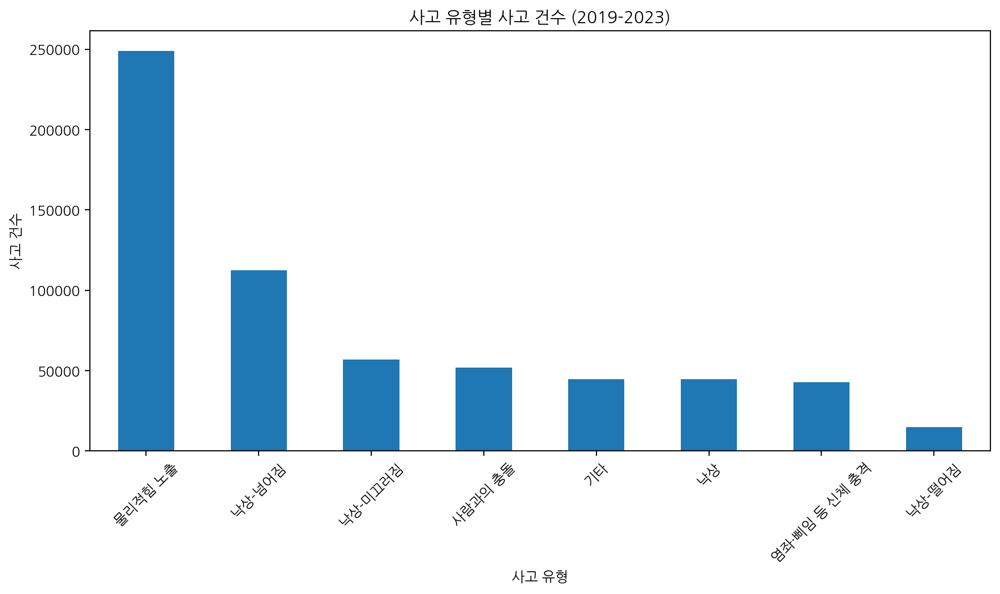

In [11]:
# Count the number of accidents per type
accident_type_counts = all_data['사고형태'].value_counts()

# Plot the bar graph
plt.figure(figsize=(10, 6))
accident_type_counts.plot(kind='bar')
plt.title('사고 유형별 사고 건수 (2019-2023)')
plt.xlabel('사고 유형')
plt.ylabel('사고 건수')
plt.xticks(rotation=45)
plt.tight_layout()

# Display the plot
plt.show()

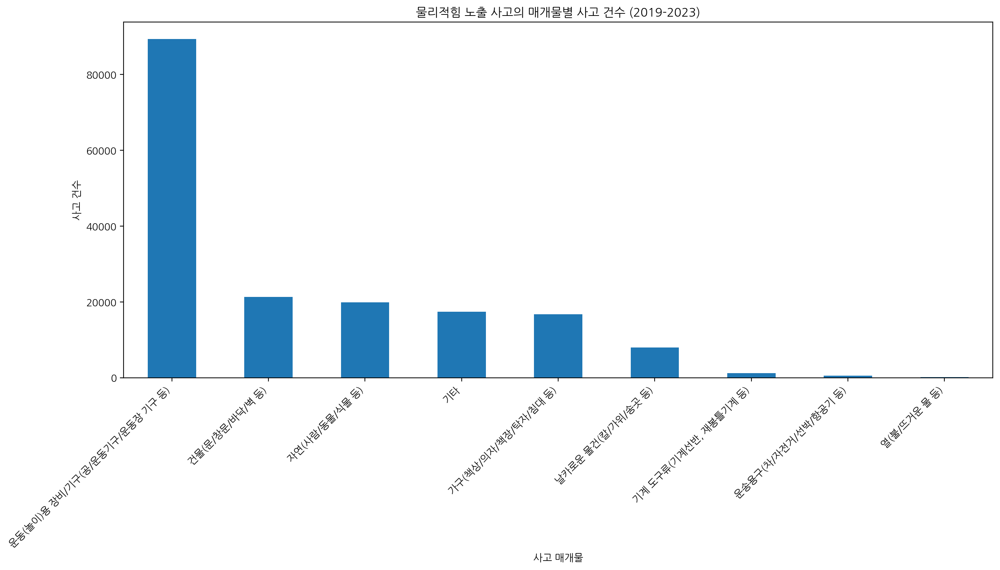

In [14]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_data = all_data[all_data['사고형태'] == '물리적힘 노출']

# Count the number of accidents per '사고매개물'
accident_medium_counts = physical_force_data['사고매개물'].value_counts()

# Plot the bar graph
plt.figure(figsize=(14, 8))
accident_medium_counts.plot(kind='bar')
plt.title('물리적힘 노출 사고의 매개물별 사고 건수 (2019-2023)')
plt.xlabel('사고 매개물')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

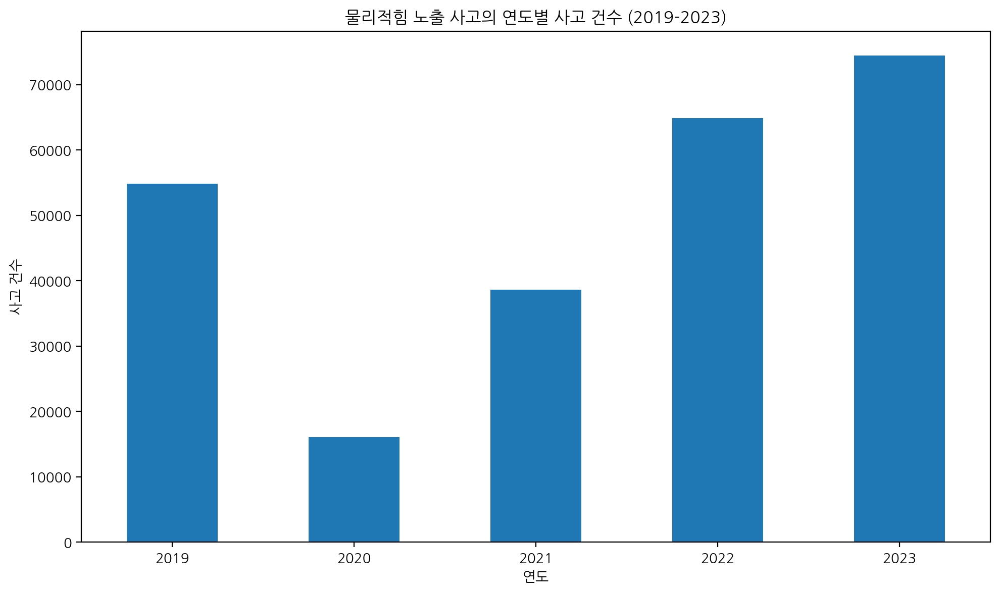

In [15]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_data = all_data[all_data['사고형태'] == '물리적힘 노출']

# Count the number of accidents per year
accident_counts_per_year = physical_force_data['Year'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(10, 6))
accident_counts_per_year.plot(kind='bar')
plt.title('물리적힘 노출 사고의 연도별 사고 건수 (2019-2023)')
plt.xlabel('연도')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.tight_layout()

# Display the plot
plt.show()

<ipython-input-16-89f3e772b4eb>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  physical_force_2019['Month'] = pd.to_datetime(physical_force_2019['사고발생일']).dt.month


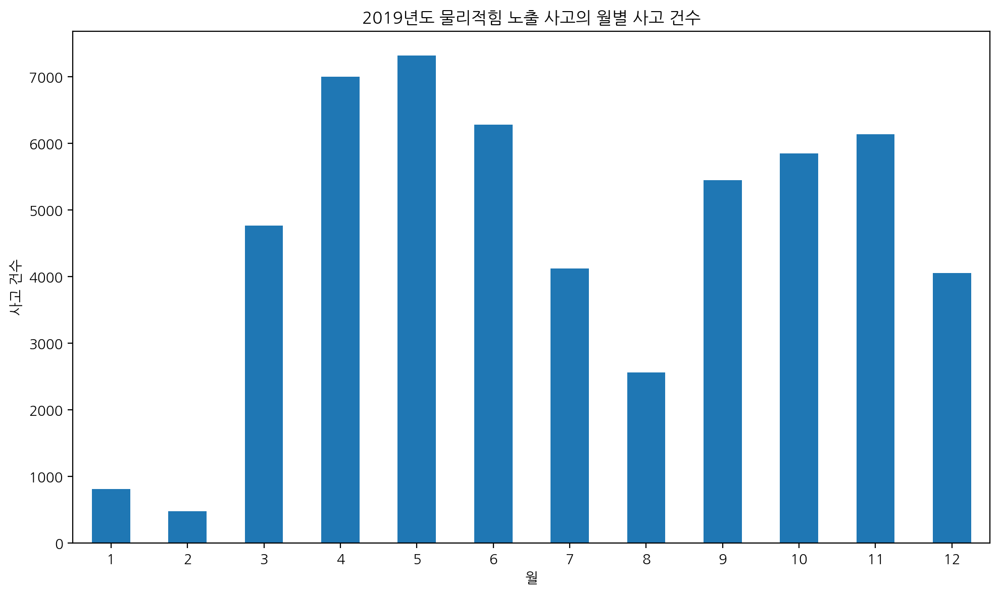

In [16]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Extract month from '사고발생일'
physical_force_2019['Month'] = pd.to_datetime(physical_force_2019['사고발생일']).dt.month

# Count the number of accidents per month
accident_counts_per_month = physical_force_2019['Month'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(10, 6))
accident_counts_per_month.plot(kind='bar')
plt.title('2019년도 물리적힘 노출 사고의 월별 사고 건수')
plt.xlabel('월')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.tight_layout()

# Display the plot
plt.show()

<ipython-input-17-1355748bdaa1>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  physical_force_2019['사고발생요일'] = pd.to_datetime(physical_force_2019['사고발생일']).dt.day_name()


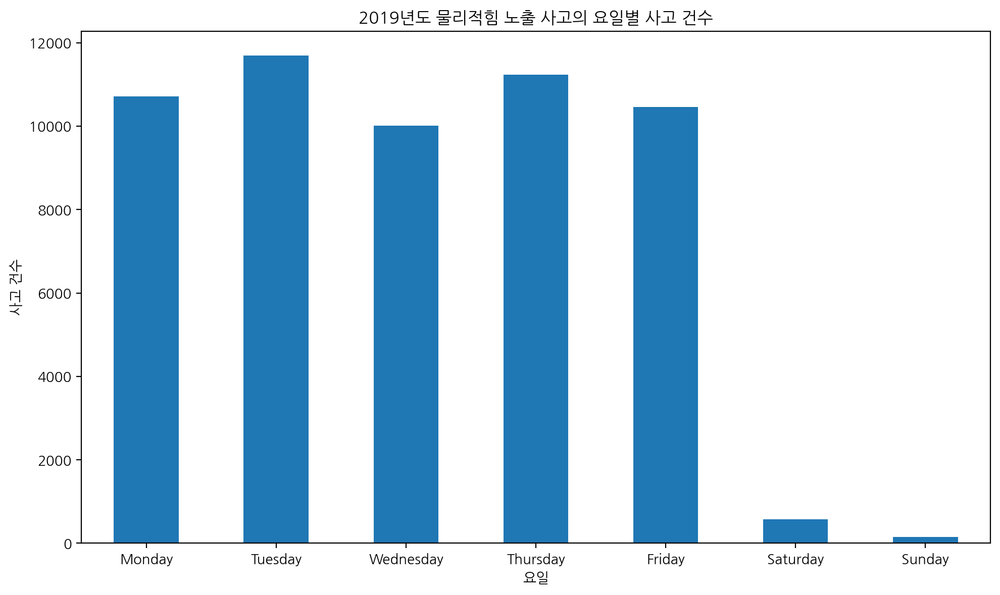

In [17]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Extract day of the week from '사고발생일'
physical_force_2019['사고발생요일'] = pd.to_datetime(physical_force_2019['사고발생일']).dt.day_name()

# Count the number of accidents per day of the week
accident_counts_per_day = physical_force_2019['사고발생요일'].value_counts().reindex([
    'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'
])

# Plot the bar graph
plt.figure(figsize=(10, 6))
accident_counts_per_day.plot(kind='bar')
plt.title('2019년도 물리적힘 노출 사고의 요일별 사고 건수')
plt.xlabel('요일')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.tight_layout()

# Display the plot
plt.show()

<ipython-input-18-0b9e8b2eaca7>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  physical_force_2019['Hour'] = pd.to_datetime(physical_force_2019['사고발생시각'], format='%H:%M').dt.hour


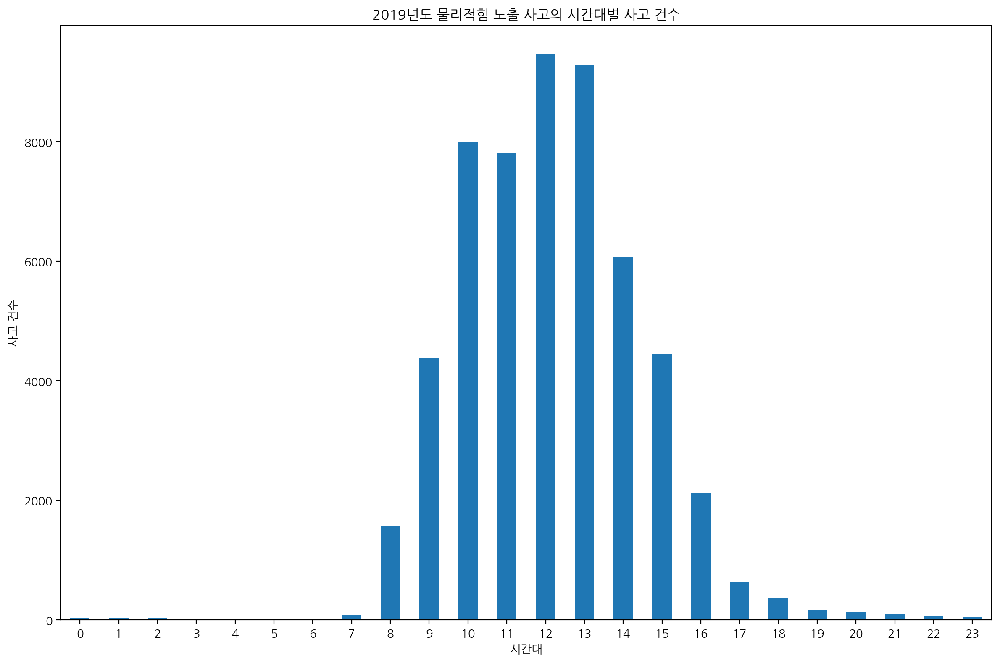

In [18]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Extract hour from '사고발생시각'
physical_force_2019['Hour'] = pd.to_datetime(physical_force_2019['사고발생시각'], format='%H:%M').dt.hour

# Count the number of accidents per hour
accident_counts_per_hour = physical_force_2019['Hour'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_counts_per_hour.plot(kind='bar')
plt.title('2019년도 물리적힘 노출 사고의 시간대별 사고 건수')
plt.xlabel('시간대')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.tight_layout()

# Display the plot
plt.show()

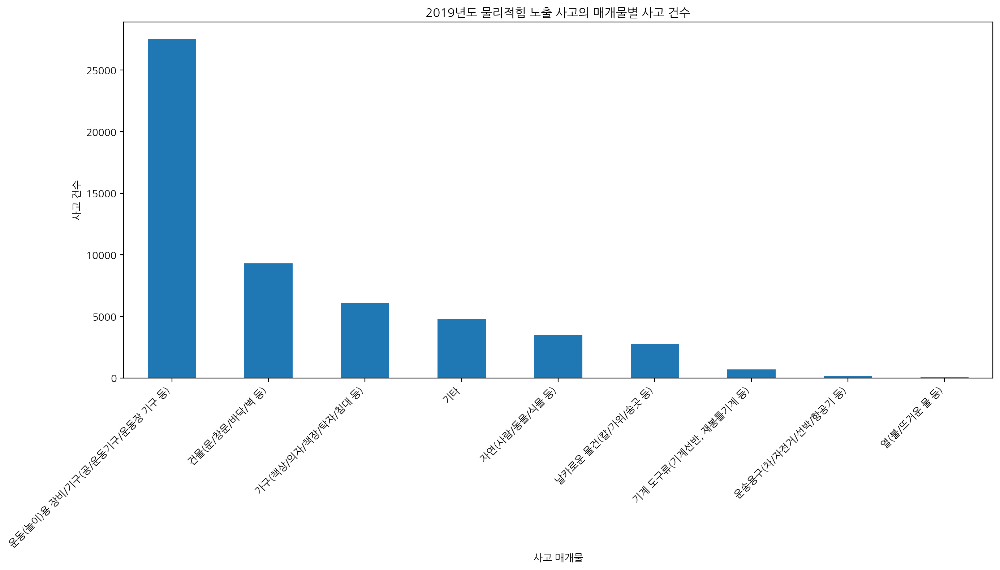

In [19]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Count the number of accidents per '사고매개물'
accident_medium_counts = physical_force_2019['사고매개물'].value_counts()

# Plot the bar graph
plt.figure(figsize=(14, 8))
accident_medium_counts.plot(kind='bar')
plt.title('2019년도 물리적힘 노출 사고의 매개물별 사고 건수')
plt.xlabel('사고 매개물')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

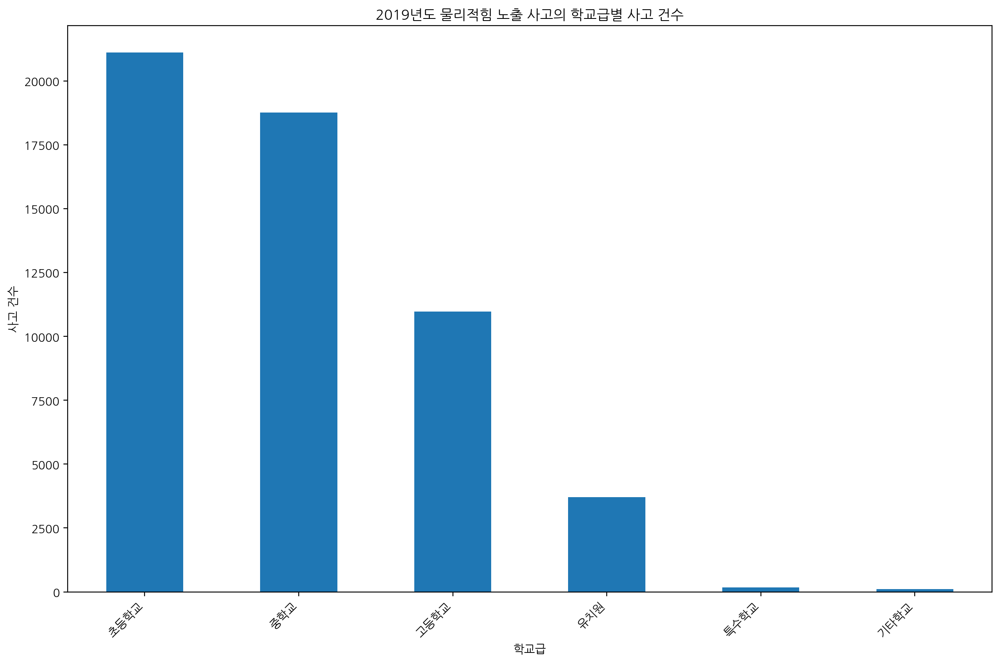

In [20]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Count the number of accidents per '학교급'
accident_school_level_counts = physical_force_2019['학교급'].value_counts()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_school_level_counts.plot(kind='bar')
plt.title('2019년도 물리적힘 노출 사고의 학교급별 사고 건수')
plt.xlabel('학교급')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()


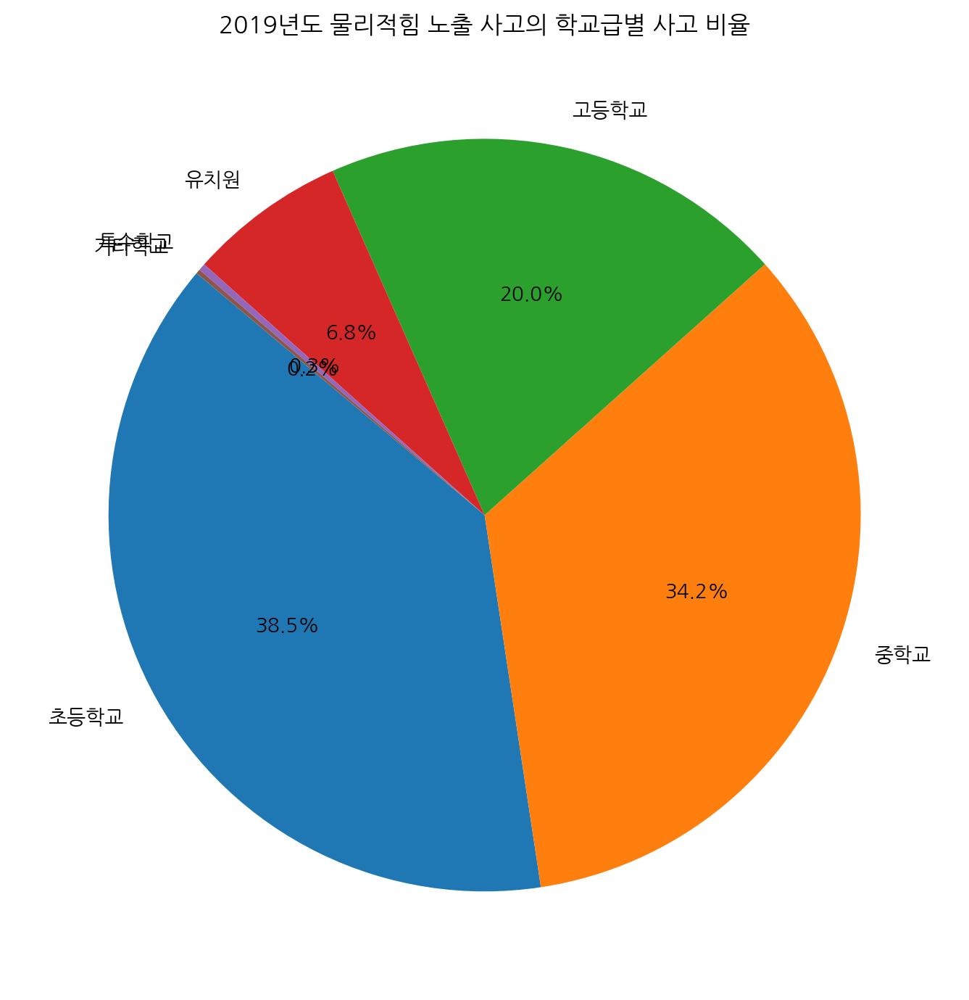

In [24]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Count the number of accidents per '학교급'
accident_school_level_counts = physical_force_2019['학교급'].value_counts()

# Plot the pie chart
plt.figure(figsize=(10, 7))
accident_school_level_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('2019년도 물리적힘 노출 사고의 학교급별 사고 비율')
plt.ylabel('')  # Hide the y-label as it's not needed for a pie chart
plt.tight_layout()

# Display the plot
plt.show()

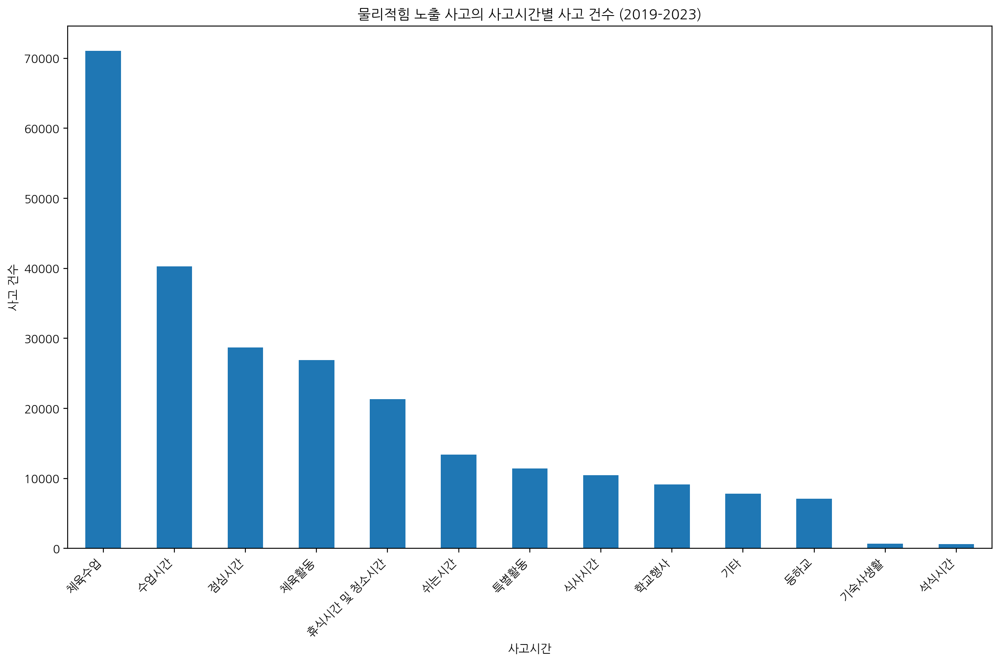

In [26]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_data = all_data[all_data['사고형태'] == '물리적힘 노출']

# Count the number of accidents per '사고시간'
accident_time_counts = physical_force_data['사고시간'].value_counts()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_time_counts.plot(kind='bar')
plt.title('물리적힘 노출 사고의 사고시간별 사고 건수 (2019-2023)')
plt.xlabel('사고시간')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

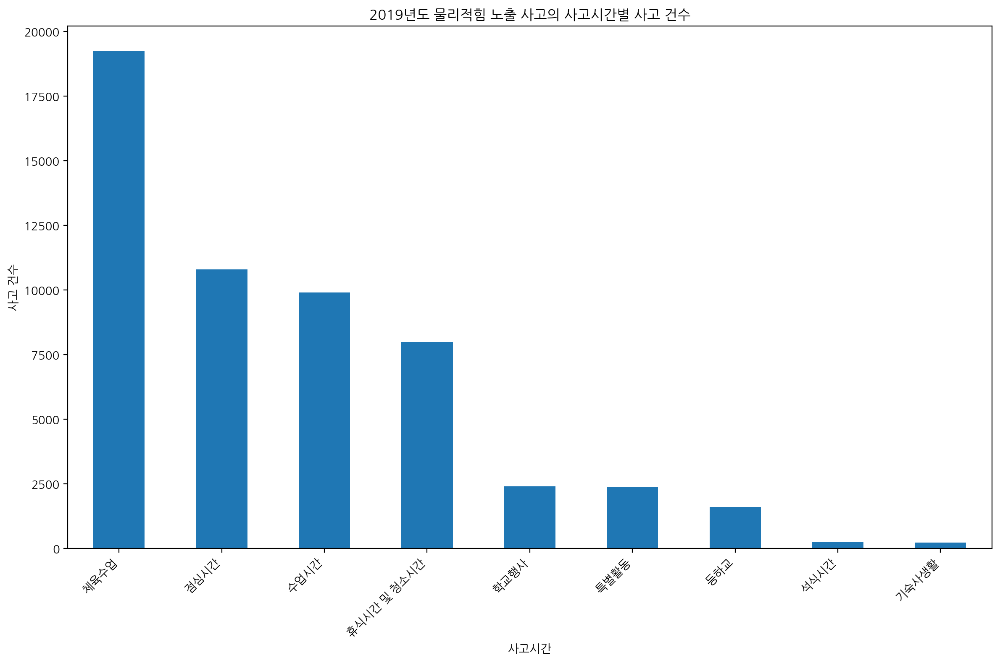

In [27]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Count the number of accidents per '사고시간'
accident_time_counts = physical_force_2019['사고시간'].value_counts()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_time_counts.plot(kind='bar')
plt.title('2019년도 물리적힘 노출 사고의 사고시간별 사고 건수')
plt.xlabel('사고시간')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

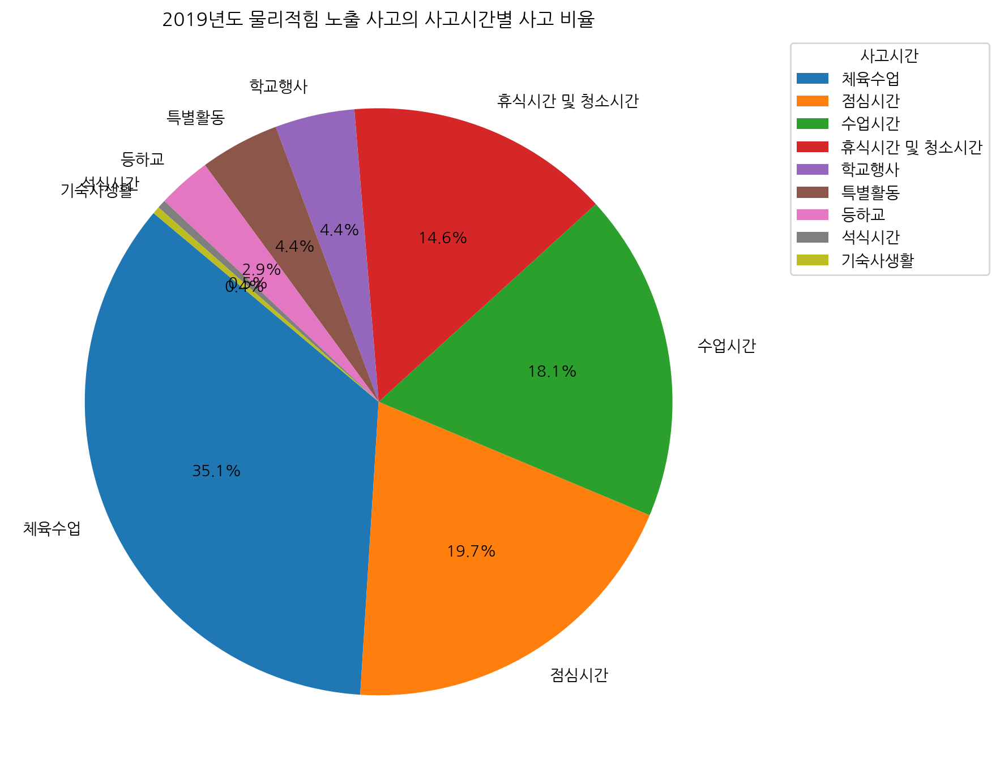

In [30]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Count the number of accidents per '사고시간'
accident_time_counts = physical_force_2019['사고시간'].value_counts()

# Plot the pie chart
plt.figure(figsize=(12, 7))
accident_time_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140, legend=True)
plt.title('2019년도 물리적힘 노출 사고의 사고시간별 사고 비율')
plt.ylabel('')  # Hide the y-label as it's not needed for a pie chart

# Add a legend with the labels to the right side
plt.legend(title='사고시간', bbox_to_anchor=(1.05, 1), loc='best')

plt.tight_layout()

# Display the plot
plt.show()

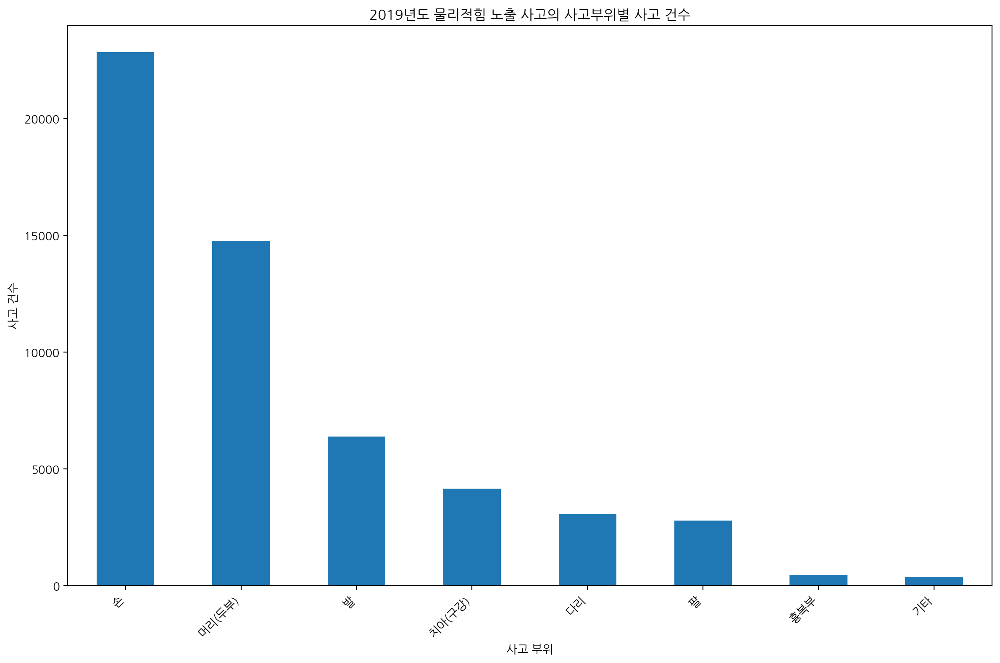

In [34]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Count the number of accidents per '사고부위'
accident_body_part_counts = physical_force_2019['사고부위'].value_counts()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_body_part_counts.plot(kind='bar')
plt.title('2019년도 물리적힘 노출 사고의 사고부위별 사고 건수')
plt.xlabel('사고 부위')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

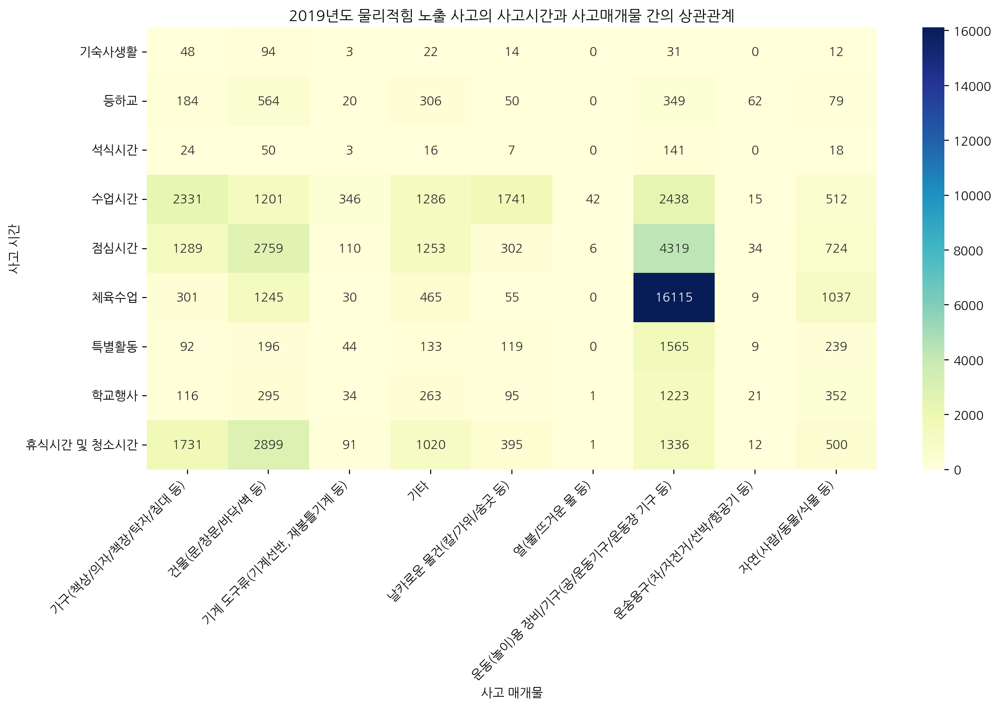

In [32]:
import seaborn as sns

# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Create a crosstab of '사고시간' and '사고매개물'
crosstab = pd.crosstab(physical_force_2019['사고시간'], physical_force_2019['사고매개물'])

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('2019년도 물리적힘 노출 사고의 사고시간과 사고매개물 간의 상관관계')
plt.xlabel('사고 매개물')
plt.ylabel('사고 시간')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

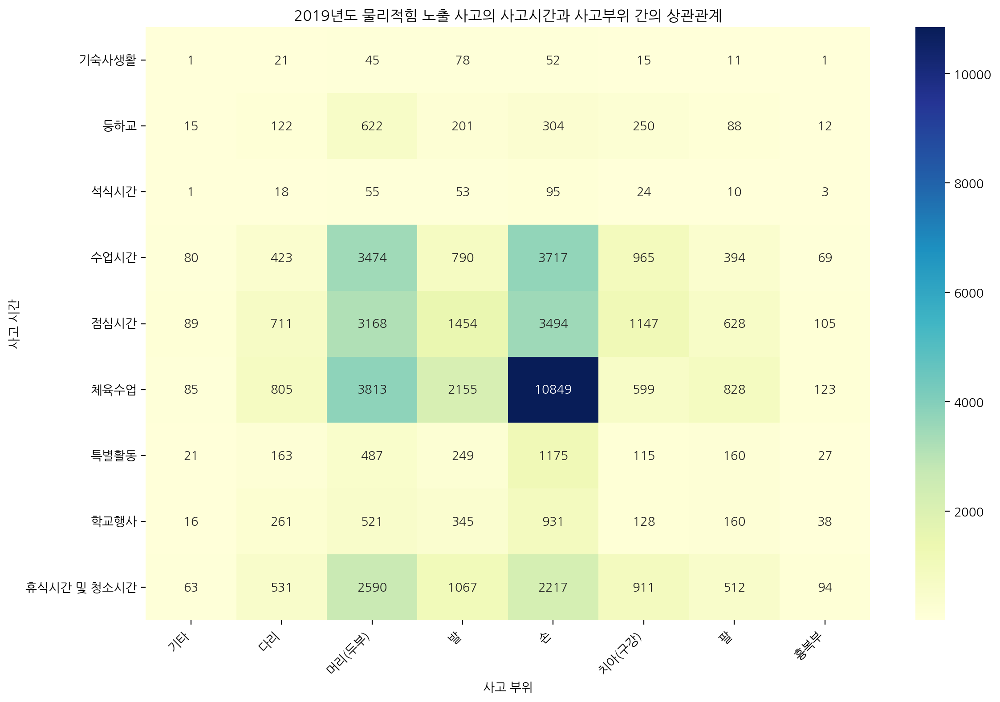

In [33]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Create a crosstab of '사고시간' and '사고부위'
crosstab = pd.crosstab(physical_force_2019['사고시간'], physical_force_2019['사고부위'])

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('2019년도 물리적힘 노출 사고의 사고시간과 사고부위 간의 상관관계')
plt.xlabel('사고 부위')
plt.ylabel('사고 시간')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

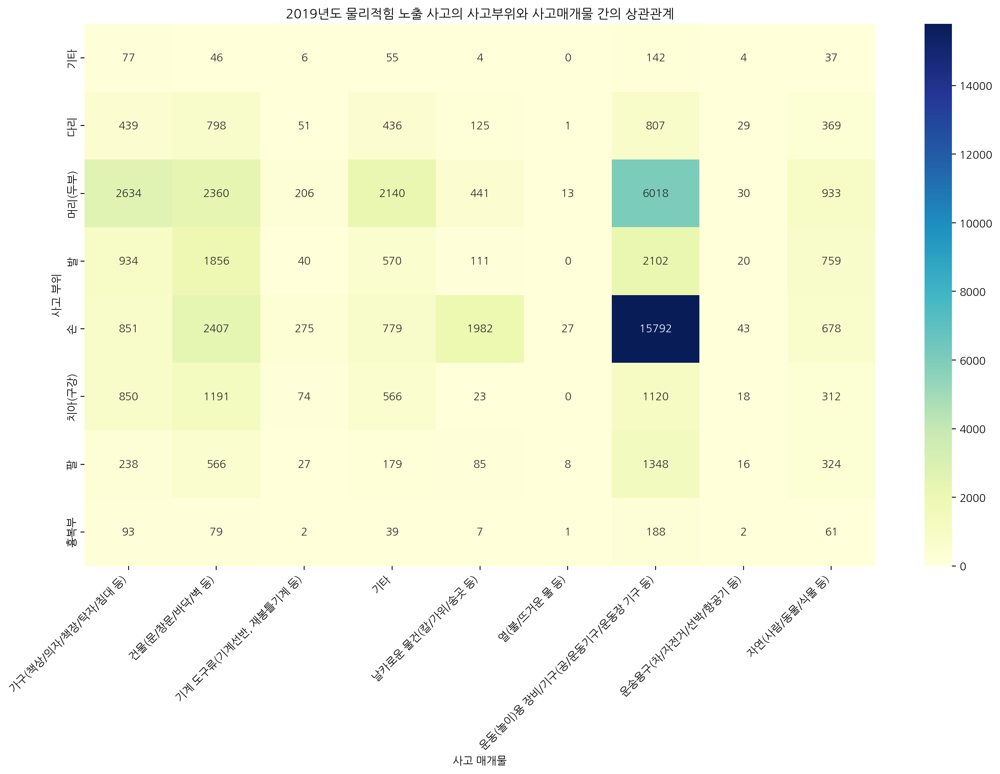

In [35]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Create a crosstab of '사고부위' and '사고매개물'
crosstab = pd.crosstab(physical_force_2019['사고부위'], physical_force_2019['사고매개물'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('2019년도 물리적힘 노출 사고의 사고부위와 사고매개물 간의 상관관계')
plt.xlabel('사고 매개물')
plt.ylabel('사고 부위')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

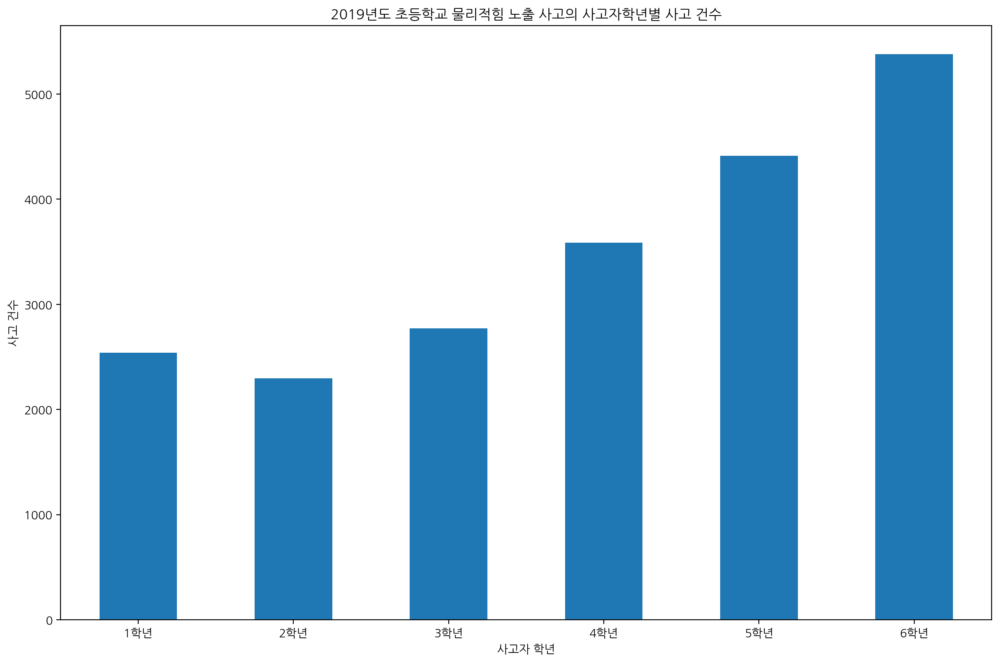

In [37]:
# Filter the data where '사고형태' is '물리적힘 노출' and '학교급' is '초등학교'
elementary_physical_force_2019 = data_2019[(data_2019['사고형태'] == '물리적힘 노출') & (data_2019['학교급'] == '초등학교')]

# Count the number of accidents per '사고자학년'
accident_grade_counts = elementary_physical_force_2019['사고자학년'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_grade_counts.plot(kind='bar')
plt.title('2019년도 초등학교 물리적힘 노출 사고의 사고자학년별 사고 건수')
plt.xlabel('사고자 학년')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.tight_layout()

# Display the plot
plt.show()

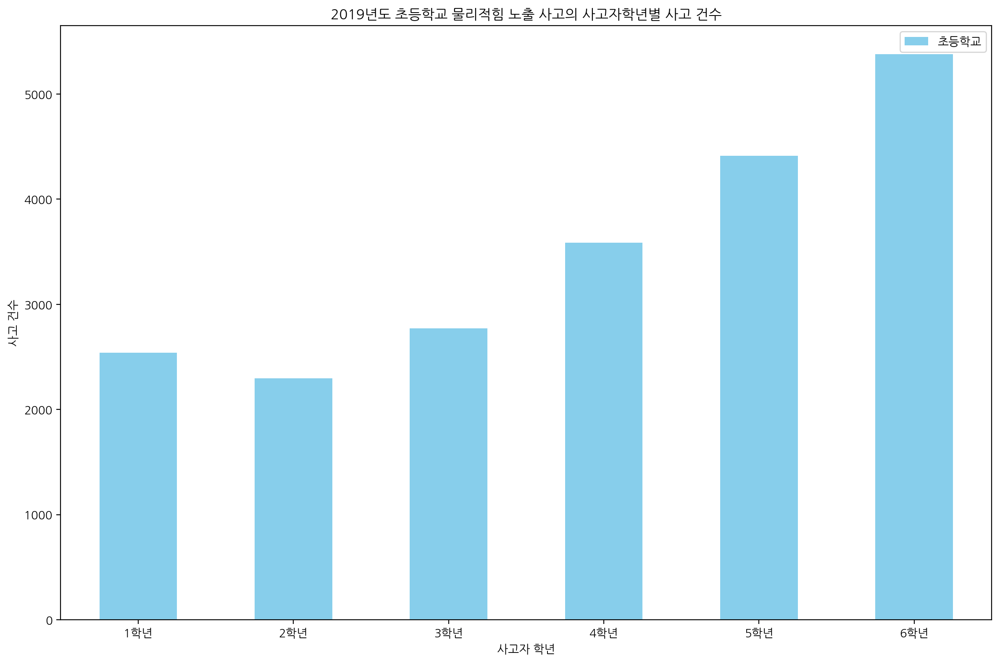

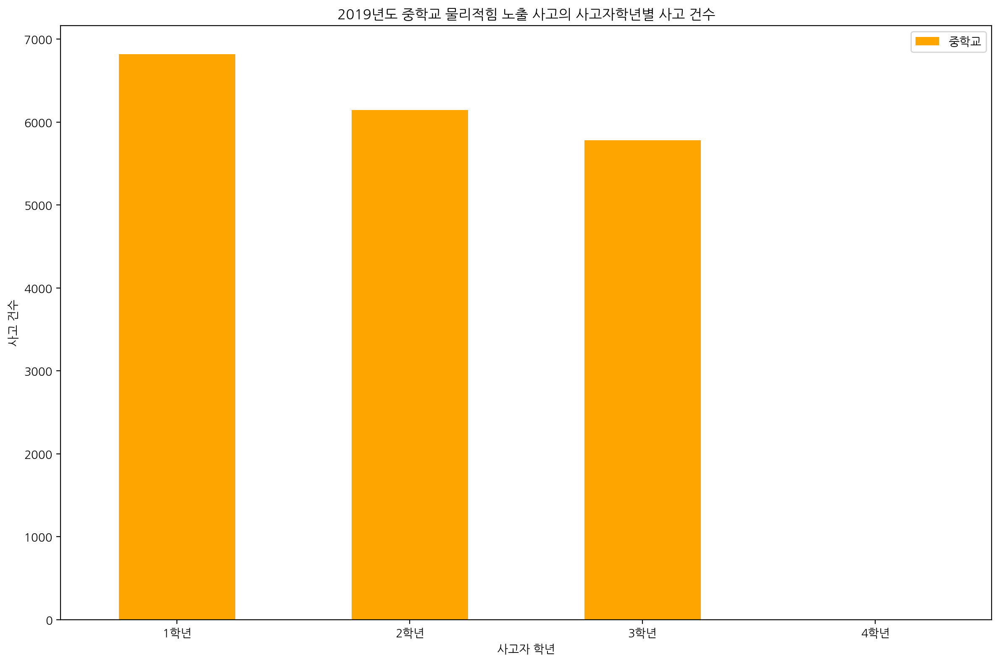

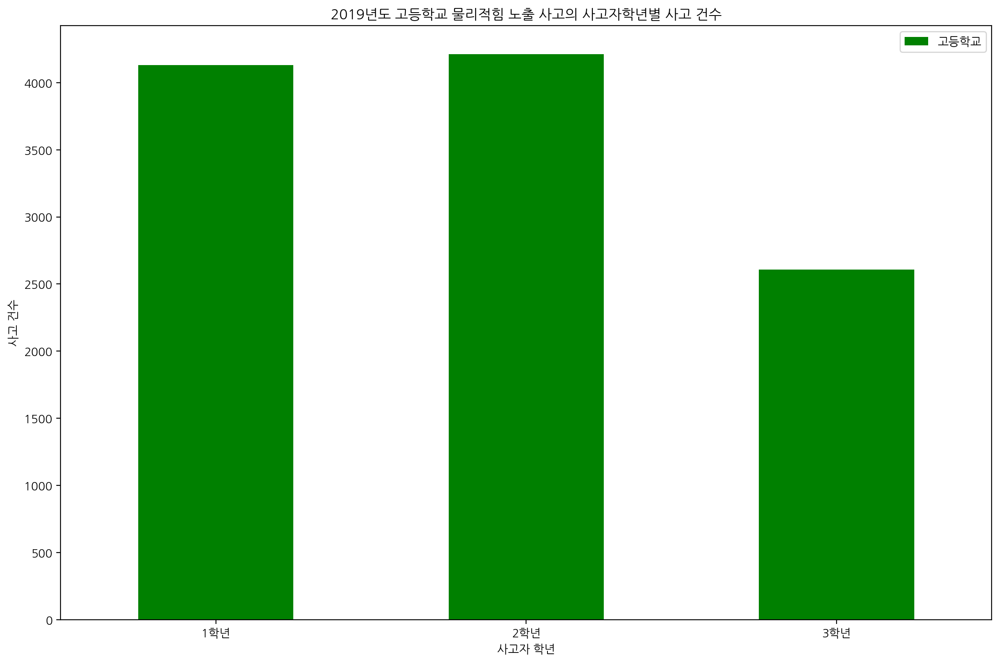

In [43]:
# Filter the data where '사고형태' is '물리적힘 노출' and '학교급' is '초등학교', '중학교' or '고등학교'
elementary_physical_force_2019 = data_2019[(data_2019['사고형태'] == '물리적힘 노출') & (data_2019['학교급'] == '초등학교')]
middle_physical_force_2019 = data_2019[(data_2019['사고형태'] == '물리적힘 노출') & (data_2019['학교급'] == '중학교')]
high_physical_force_2019 = data_2019[(data_2019['사고형태'] == '물리적힘 노출') & (data_2019['학교급'] == '고등학교')]

# Count the number of accidents per '사고자학년' for each school level
elementary_accident_grade_counts = elementary_physical_force_2019['사고자학년'].value_counts().sort_index()
middle_accident_grade_counts = middle_physical_force_2019['사고자학년'].value_counts().sort_index()
high_accident_grade_counts = high_physical_force_2019['사고자학년'].value_counts().sort_index()

# Plot the bar graph for elementary school
plt.figure(figsize=(12, 8))
elementary_accident_grade_counts.plot(kind='bar', color='skyblue', label='초등학교')
plt.title('2019년도 초등학교 물리적힘 노출 사고의 사고자학년별 사고 건수')
plt.xlabel('사고자 학년')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.legend()
plt.tight_layout()
plt.show()

# Plot the bar graph for middle school
plt.figure(figsize=(12, 8))
middle_accident_grade_counts.plot(kind='bar', color='orange', label='중학교')
plt.title('2019년도 중학교 물리적힘 노출 사고의 사고자학년별 사고 건수')
plt.xlabel('사고자 학년')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.legend()
plt.tight_layout()
plt.show()

# Plot the bar graph for high school
plt.figure(figsize=(12, 8))
high_accident_grade_counts.plot(kind='bar', color='green', label='고등학교')
plt.title('2019년도 고등학교 물리적힘 노출 사고의 사고자학년별 사고 건수')
plt.xlabel('사고자 학년')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.legend()
plt.tight_layout()
plt.show()

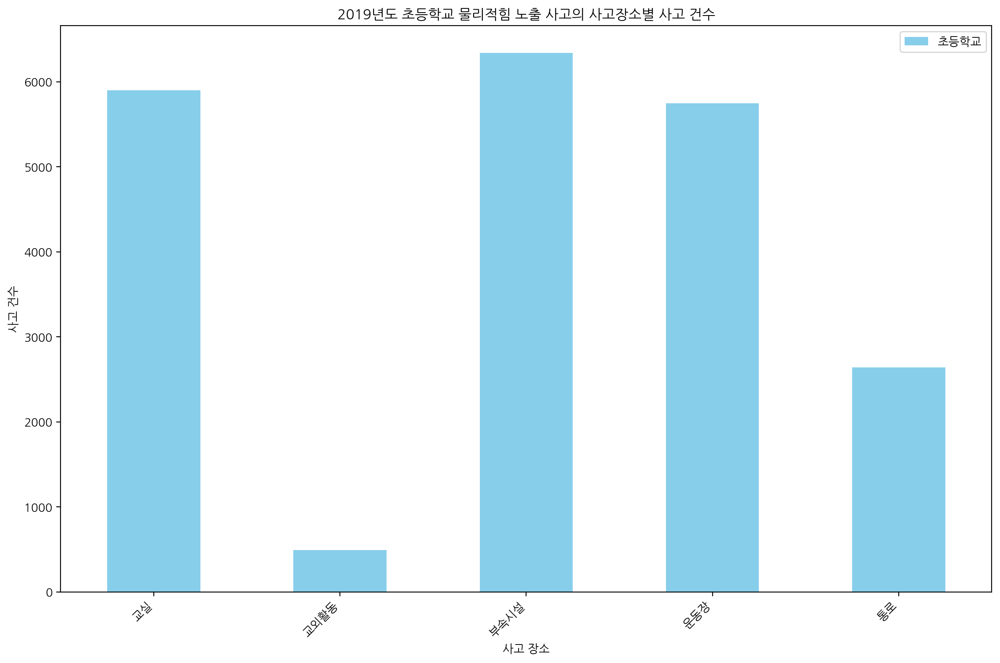

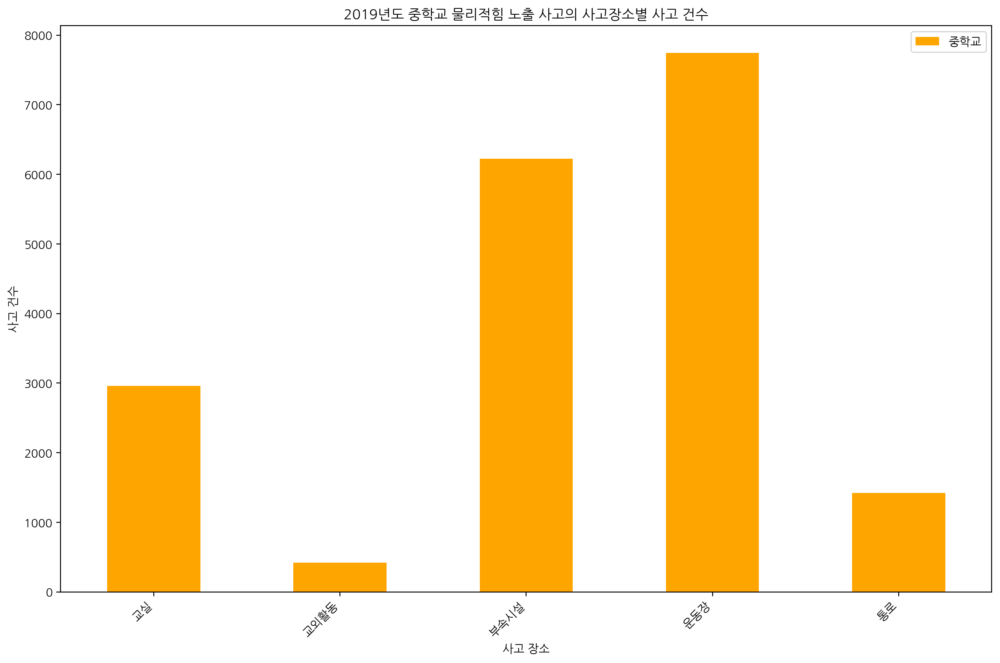

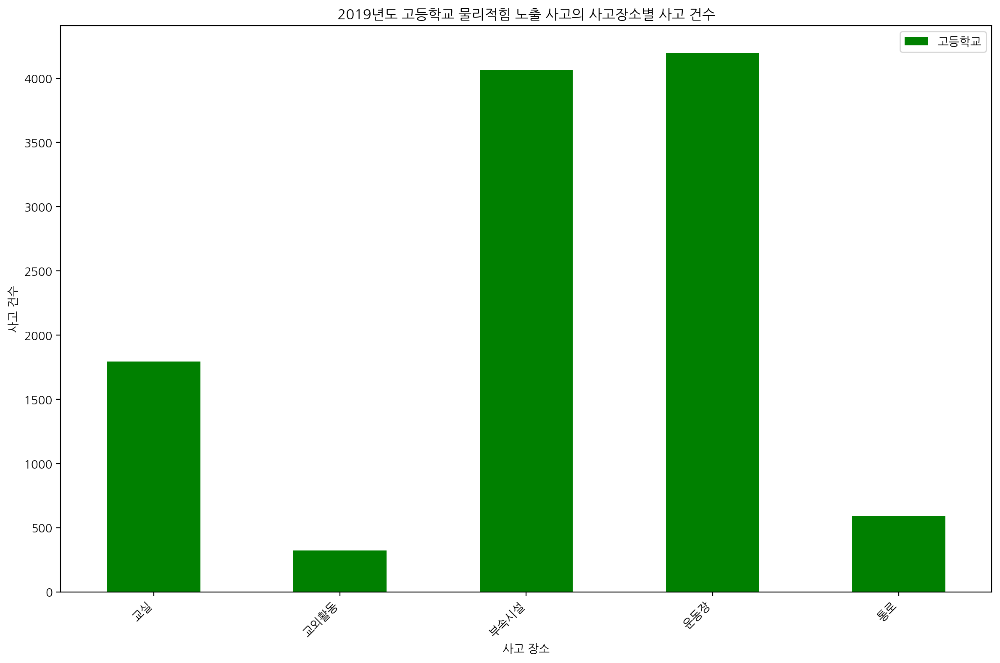

In [44]:
# Filter the data where '사고형태' is '물리적힘 노출' and '학교급' is '초등학교', '중학교' or '고등학교'
elementary_physical_force_2019 = data_2019[(data_2019['사고형태'] == '물리적힘 노출') & (data_2019['학교급'] == '초등학교')]
middle_physical_force_2019 = data_2019[(data_2019['사고형태'] == '물리적힘 노출') & (data_2019['학교급'] == '중학교')]
high_physical_force_2019 = data_2019[(data_2019['사고형태'] == '물리적힘 노출') & (data_2019['학교급'] == '고등학교')]

# Count the number of accidents per '사고장소' for each school level
elementary_accident_location_counts = elementary_physical_force_2019['사고장소'].value_counts().sort_index()
middle_accident_location_counts = middle_physical_force_2019['사고장소'].value_counts().sort_index()
high_accident_location_counts = high_physical_force_2019['사고장소'].value_counts().sort_index()

# Plot the bar graph for elementary school
if not elementary_accident_location_counts.empty:
    plt.figure(figsize=(12, 8))
    elementary_accident_location_counts.plot(kind='bar', color='skyblue', label='초등학교')
    plt.title('2019년도 초등학교 물리적힘 노출 사고의 사고장소별 사고 건수')
    plt.xlabel('사고 장소')
    plt.ylabel('사고 건수')
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot the bar graph for middle school
if not middle_accident_location_counts.empty:
    plt.figure(figsize=(12, 8))
    middle_accident_location_counts.plot(kind='bar', color='orange', label='중학교')
    plt.title('2019년도 중학교 물리적힘 노출 사고의 사고장소별 사고 건수')
    plt.xlabel('사고 장소')
    plt.ylabel('사고 건수')
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot the bar graph for high school
if not high_accident_location_counts.empty:
    plt.figure(figsize=(12, 8))
    high_accident_location_counts.plot(kind='bar', color='green', label='고등학교')
    plt.title('2019년도 고등학교 물리적힘 노출 사고의 사고장소별 사고 건수')
    plt.xlabel('사고 장소')
    plt.ylabel('사고 건수')
    plt.xticks(rotation=45, ha='right')
    plt.legend()
    plt.tight_layout()
    plt.show()

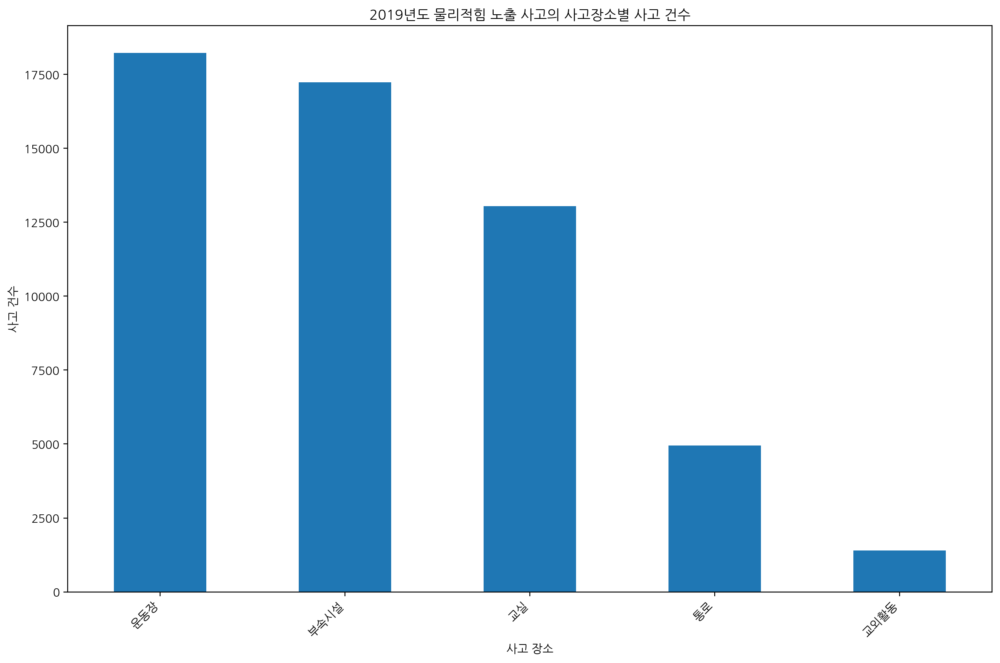

In [45]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Count the number of accidents per '사고장소'
accident_location_counts = physical_force_2019['사고장소'].value_counts()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_location_counts.plot(kind='bar')
plt.title('2019년도 물리적힘 노출 사고의 사고장소별 사고 건수')
plt.xlabel('사고 장소')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

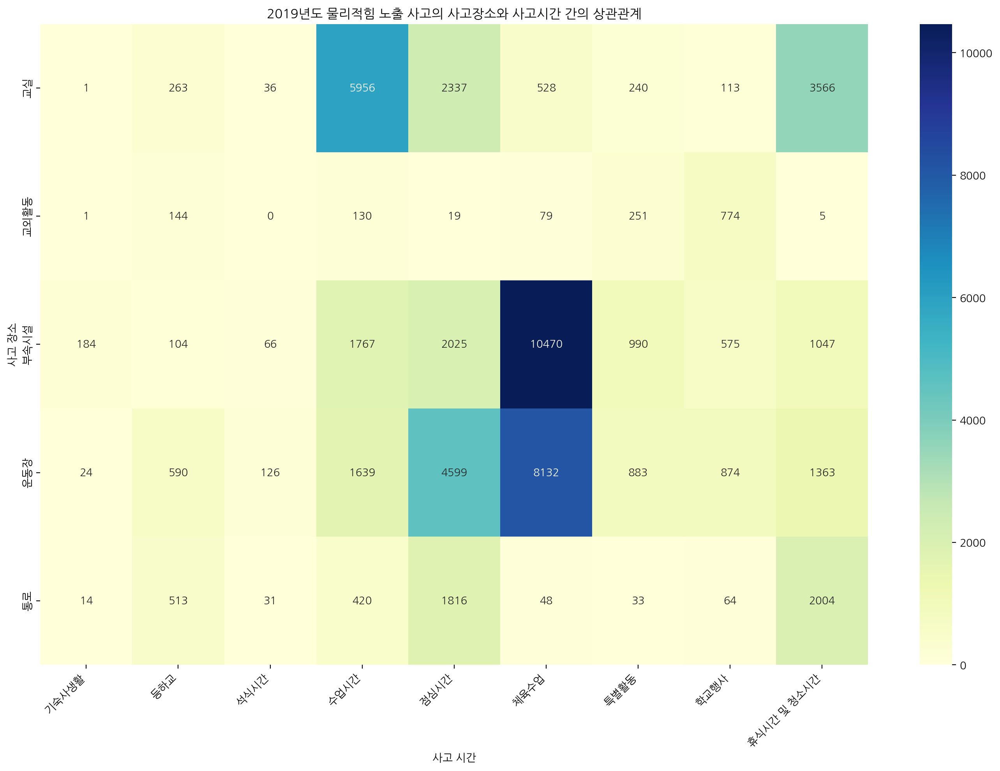

In [46]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Create a crosstab of '사고장소' and '사고시간'
crosstab = pd.crosstab(physical_force_2019['사고장소'], physical_force_2019['사고시간'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('2019년도 물리적힘 노출 사고의 사고장소와 사고시간 간의 상관관계')
plt.xlabel('사고 시간')
plt.ylabel('사고 장소')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

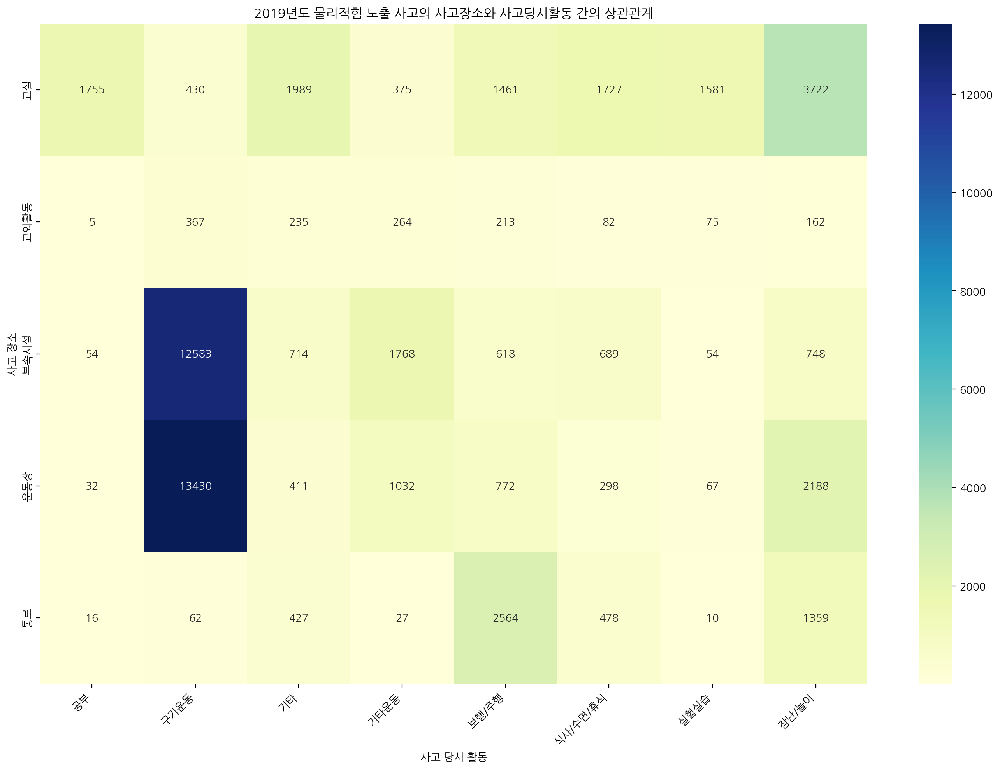

In [47]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Create a crosstab of '사고장소' and '사고당시활동'
crosstab = pd.crosstab(physical_force_2019['사고장소'], physical_force_2019['사고당시활동'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('2019년도 물리적힘 노출 사고의 사고장소와 사고당시활동 간의 상관관계')
plt.xlabel('사고 당시 활동')
plt.ylabel('사고 장소')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

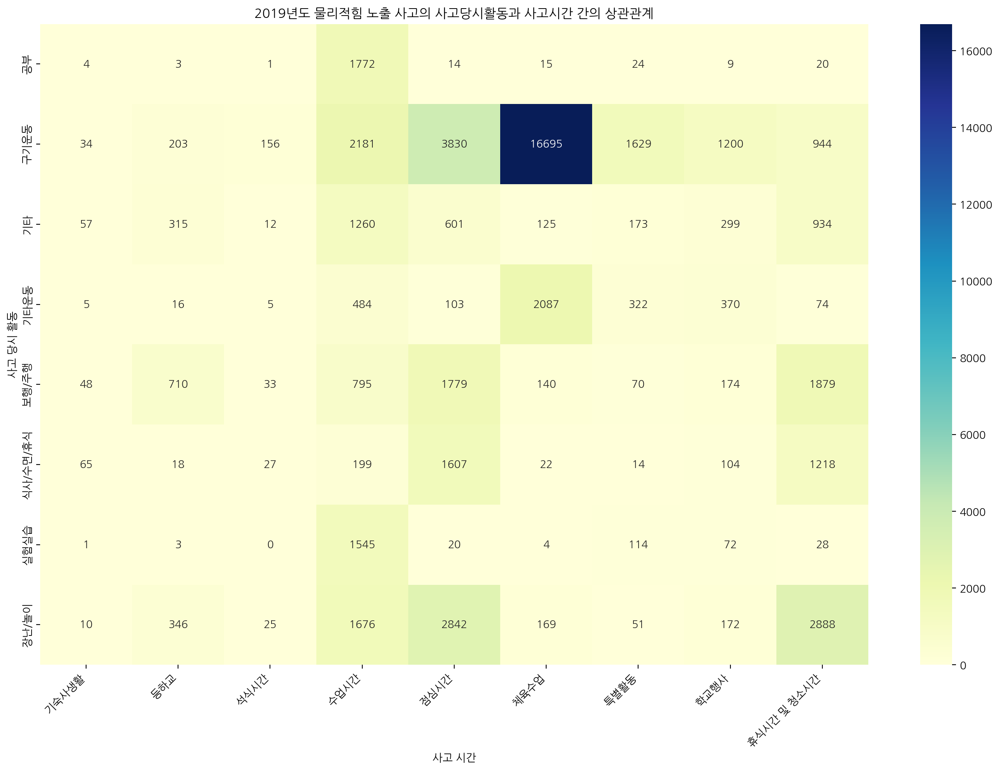

In [48]:
# Filter the data where '사고형태' is '물리적힘 노출'
physical_force_2019 = data_2019[data_2019['사고형태'] == '물리적힘 노출']

# Create a crosstab of '사고당시활동' and '사고시간'
crosstab = pd.crosstab(physical_force_2019['사고당시활동'], physical_force_2019['사고시간'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('2019년도 물리적힘 노출 사고의 사고당시활동과 사고시간 간의 상관관계')
plt.xlabel('사고 시간')
plt.ylabel('사고 당시 활동')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

In [59]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data for all years and concatenate them
file_path = '/content/drive/MyDrive/data/★2019~2023 학교안전사고 데이터_수정.xlsx'
data_2019 = pd.read_excel(file_path, sheet_name='2019')
data_2020 = pd.read_excel(file_path, sheet_name='2020')
data_2021 = pd.read_excel(file_path, sheet_name='2021')
data_2022 = pd.read_excel(file_path, sheet_name='2022')
data_2023 = pd.read_excel(file_path, sheet_name='2023')

# Add 'Year' column to each dataset
data_2019['Year'] = 2019
data_2020['Year'] = 2020
data_2021['Year'] = 2021
data_2022['Year'] = 2022
data_2023['Year'] = 2023

# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

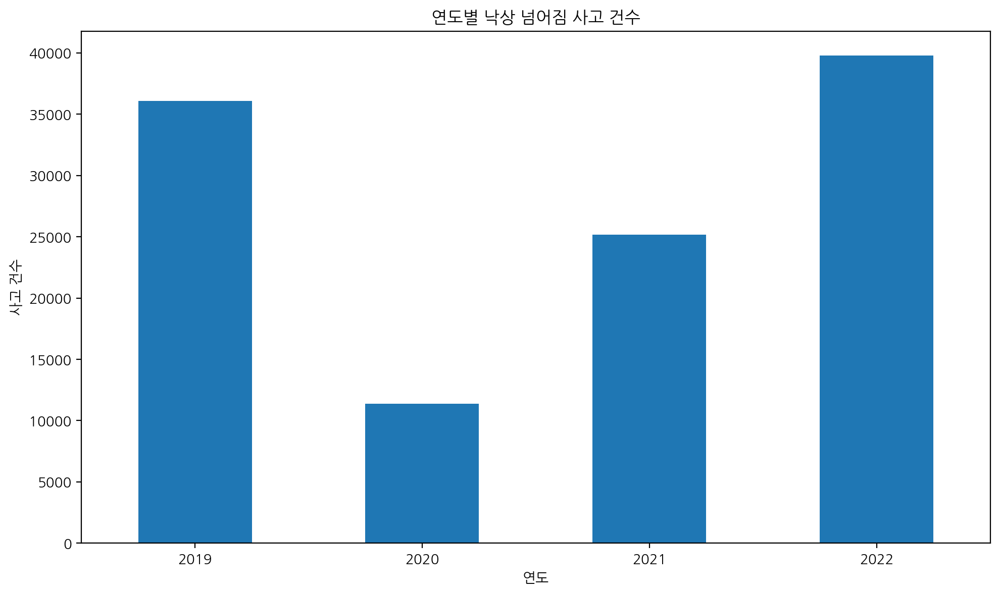

<ipython-input-60-979e452c356e>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  falling_accidents['Month'] = pd.to_datetime(falling_accidents['사고발생일']).dt.month


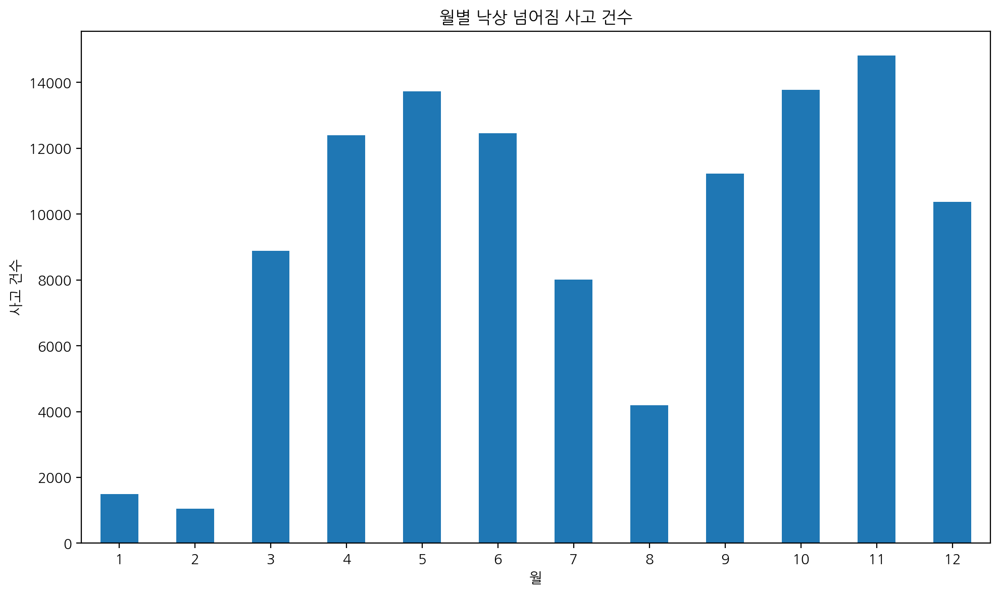

<ipython-input-60-979e452c356e>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  falling_accidents['Hour'] = pd.to_datetime(falling_accidents['사고발생시각'], format='%H:%M').dt.hour


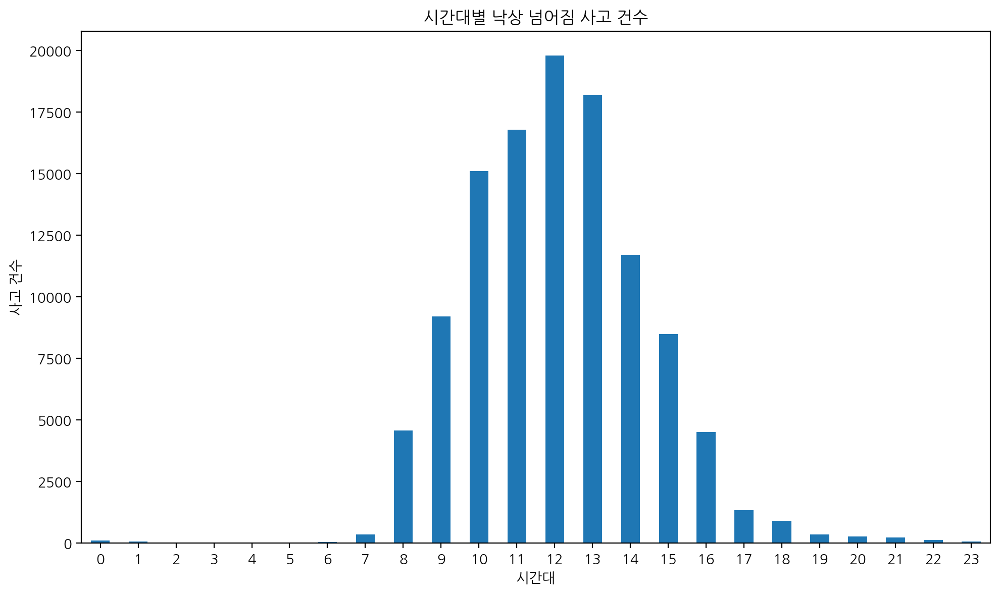

In [60]:
# Filter the data where '사고형태' is '낙상 넘어짐'
falling_accidents = all_data[all_data['사고형태'] == '낙상-넘어짐']

# Analysis 1: Yearly accident counts
yearly_counts = falling_accidents['Year'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
yearly_counts.plot(kind='bar')
plt.title('연도별 낙상 넘어짐 사고 건수')
plt.xlabel('연도')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Analysis 2: Monthly accident counts
falling_accidents['Month'] = pd.to_datetime(falling_accidents['사고발생일']).dt.month
monthly_counts = falling_accidents['Month'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
monthly_counts.plot(kind='bar')
plt.title('월별 낙상 넘어짐 사고 건수')
plt.xlabel('월')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Analysis 3: Hourly accident counts
falling_accidents['Hour'] = pd.to_datetime(falling_accidents['사고발생시각'], format='%H:%M').dt.hour
hourly_counts = falling_accidents['Hour'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
hourly_counts.plot(kind='bar')
plt.title('시간대별 낙상 넘어짐 사고 건수')
plt.xlabel('시간대')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

<ipython-input-61-27b0c9faeeec>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  falling_accidents['Hour'] = pd.to_datetime(falling_accidents['사고발생시각'], format='%H:%M').dt.hour
<ipython-input-61-27b0c9faeeec>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  falling_accidents['Time Period'] = falling_accidents['Hour'].apply(time_period)


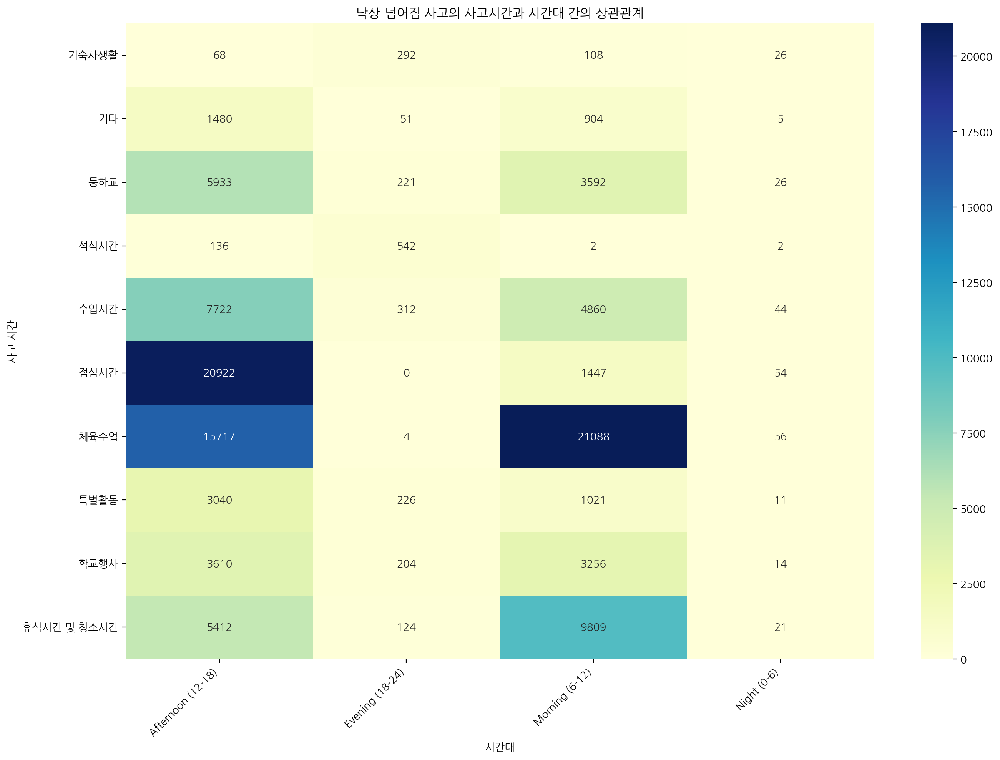

In [61]:
# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022], ignore_index=True)

# Filter the data where '사고형태' is '낙상-넘어짐'
falling_accidents = all_data[all_data['사고형태'] == '낙상-넘어짐']

# Check if there are any falling accidents
if not falling_accidents.empty:
    # Extract hour from '사고발생시각'
    falling_accidents['Hour'] = pd.to_datetime(falling_accidents['사고발생시각'], format='%H:%M').dt.hour

    # Define time periods
    def time_period(hour):
        if 6 <= hour < 12:
            return 'Morning (6-12)'
        elif 12 <= hour < 18:
            return 'Afternoon (12-18)'
        elif 18 <= hour < 24:
            return 'Evening (18-24)'
        else:
            return 'Night (0-6)'

    falling_accidents['Time Period'] = falling_accidents['Hour'].apply(time_period)

    # Create a crosstab of '사고시간' and 'Time Period'
    crosstab = pd.crosstab(falling_accidents['사고시간'], falling_accidents['Time Period'])

    # Plot the heatmap
    plt.figure(figsize=(14, 10))
    sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
    plt.title('낙상-넘어짐 사고의 사고시간과 시간대 간의 상관관계')
    plt.xlabel('시간대')
    plt.ylabel('사고 시간')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
else:
    print("낙상-넘어짐 사고 데이터가 없습니다.")

<ipython-input-62-203d3baa2ae5>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  falling_accidents['Hour'] = pd.to_datetime(falling_accidents['사고발생시각'], format='%H:%M').dt.hour


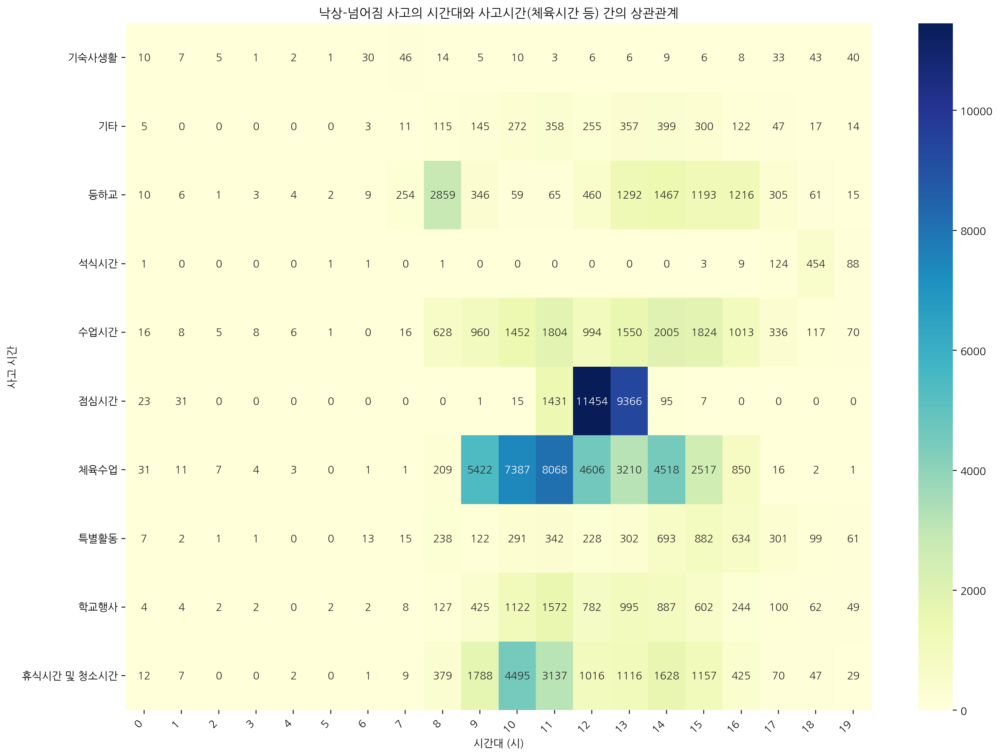

In [62]:
# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

# Filter the data where '사고형태' is '낙상-넘어짐'
falling_accidents = all_data[all_data['사고형태'] == '낙상-넘어짐']

# Extract hour from '사고발생시각'
falling_accidents['Hour'] = pd.to_datetime(falling_accidents['사고발생시각'], format='%H:%M').dt.hour

# Filter for hours up to 7 PM (19:00)
falling_accidents = falling_accidents[falling_accidents['Hour'] <= 19]

# Create a crosstab of '사고시간' and 'Hour'
crosstab = pd.crosstab(falling_accidents['사고시간'], falling_accidents['Hour'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('낙상-넘어짐 사고의 시간대와 사고시간(체육시간 등) 간의 상관관계')
plt.xlabel('시간대 (시)')
plt.ylabel('사고 시간')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

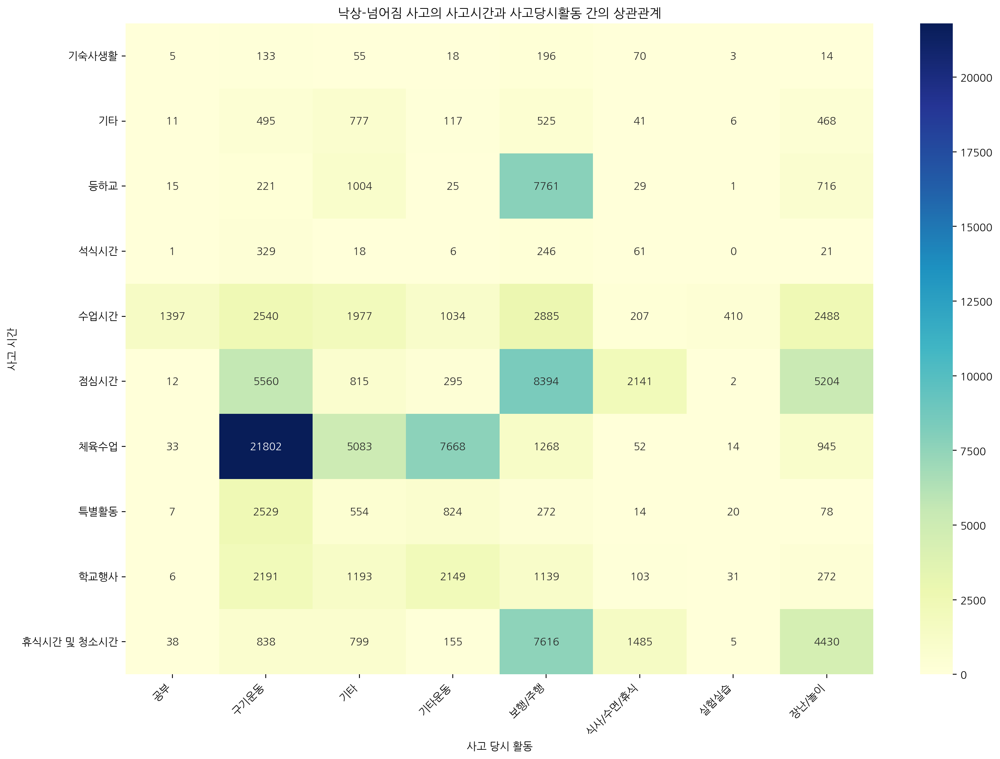

In [63]:
# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

# Filter the data where '사고형태' is '낙상-넘어짐'
falling_accidents = all_data[all_data['사고형태'] == '낙상-넘어짐']

# Create a crosstab of '사고시간' and '사고당시활동'
crosstab = pd.crosstab(falling_accidents['사고시간'], falling_accidents['사고당시활동'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('낙상-넘어짐 사고의 사고시간과 사고당시활동 간의 상관관계')
plt.xlabel('사고 당시 활동')
plt.ylabel('사고 시간')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()


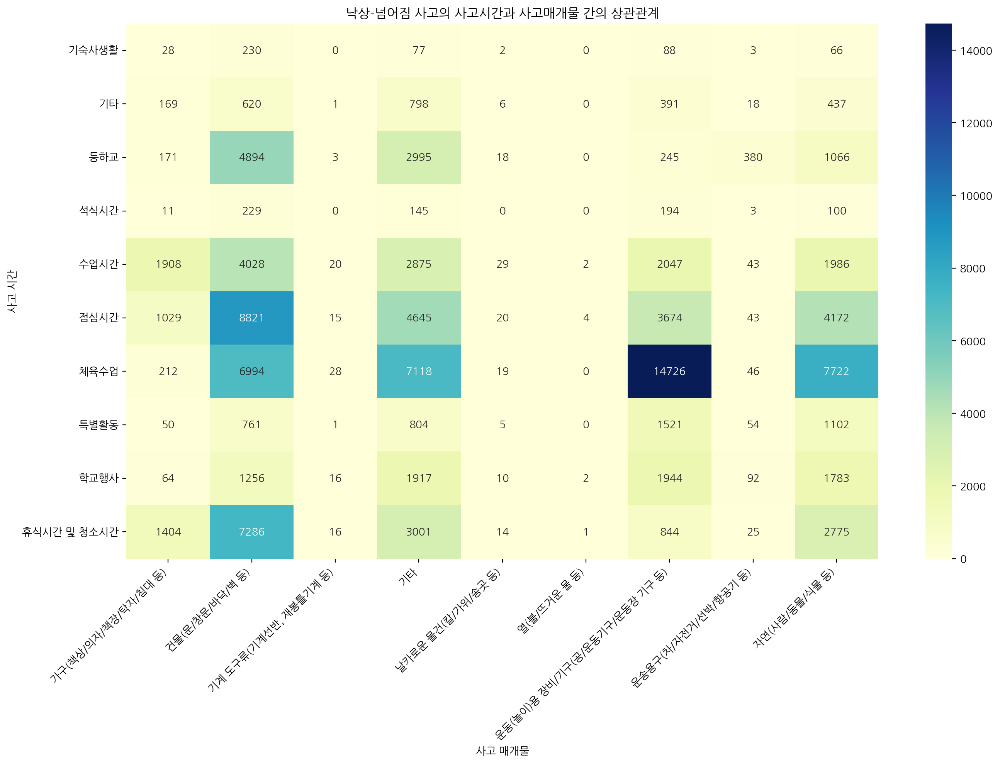

In [64]:
# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

# Filter the data where '사고형태' is '낙상-넘어짐'
falling_accidents = all_data[all_data['사고형태'] == '낙상-넘어짐']

# Create a crosstab of '사고시간' and '사고매개물'
crosstab = pd.crosstab(falling_accidents['사고시간'], falling_accidents['사고매개물'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('낙상-넘어짐 사고의 사고시간과 사고매개물 간의 상관관계')
plt.xlabel('사고 매개물')
plt.ylabel('사고 시간')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

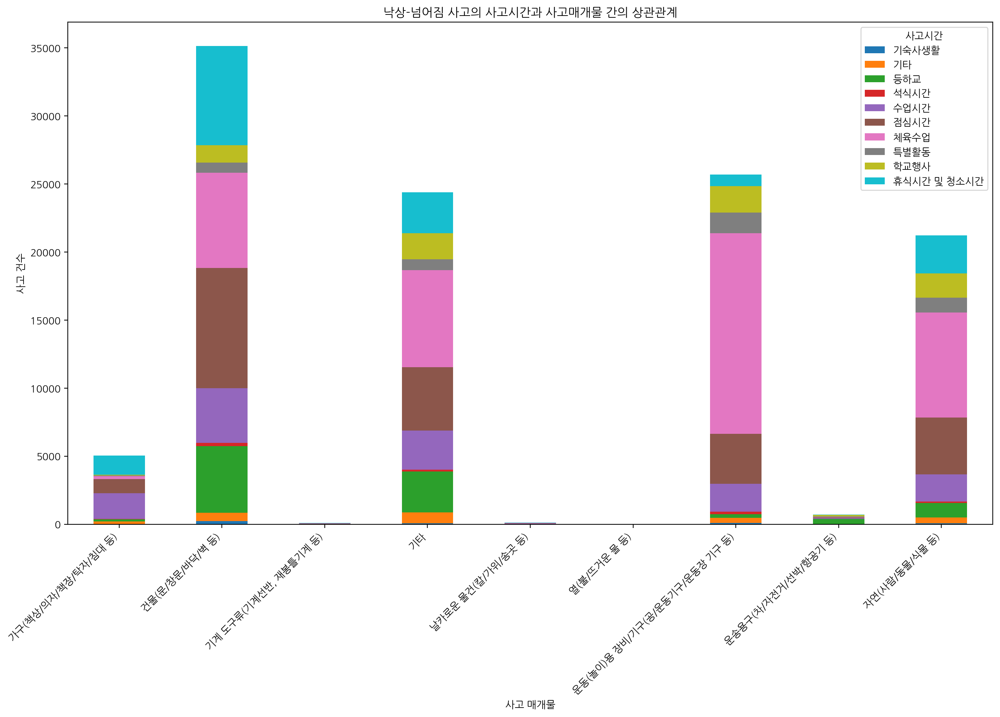

In [66]:
# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

# Filter the data where '사고형태' is '낙상-넘어짐'
falling_accidents = all_data[all_data['사고형태'] == '낙상-넘어짐']

# Create a crosstab of '사고시간' and '사고매개물'
crosstab = pd.crosstab(falling_accidents['사고매개물'], falling_accidents['사고시간'])

# Plot the stacked bar chart
crosstab.plot(kind='bar', stacked=True, figsize=(14, 10))
plt.title('낙상-넘어짐 사고의 사고시간과 사고매개물 간의 상관관계')
plt.xlabel('사고 매개물')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

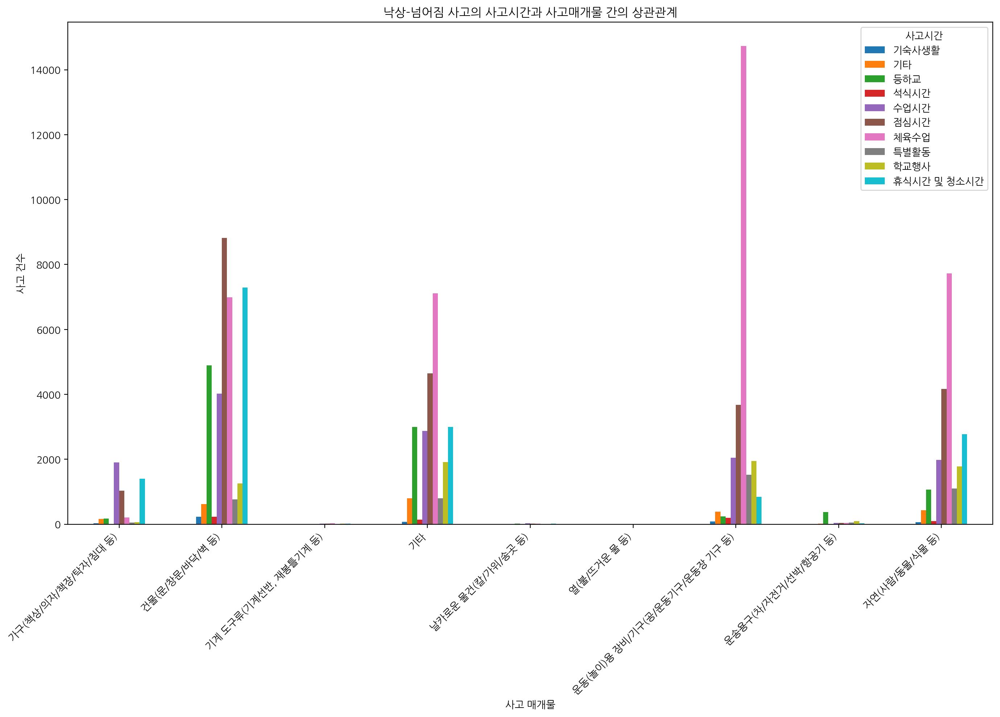

In [67]:
# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

# Filter the data where '사고형태' is '낙상-넘어짐'
falling_accidents = all_data[all_data['사고형태'] == '낙상-넘어짐']

# Create a crosstab of '사고시간' and '사고매개물'
crosstab = pd.crosstab(falling_accidents['사고매개물'], falling_accidents['사고시간'])

# Plot the clustered bar chart
crosstab.plot(kind='bar', figsize=(14, 10))
plt.title('낙상-넘어짐 사고의 사고시간과 사고매개물 간의 상관관계')
plt.xlabel('사고 매개물')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

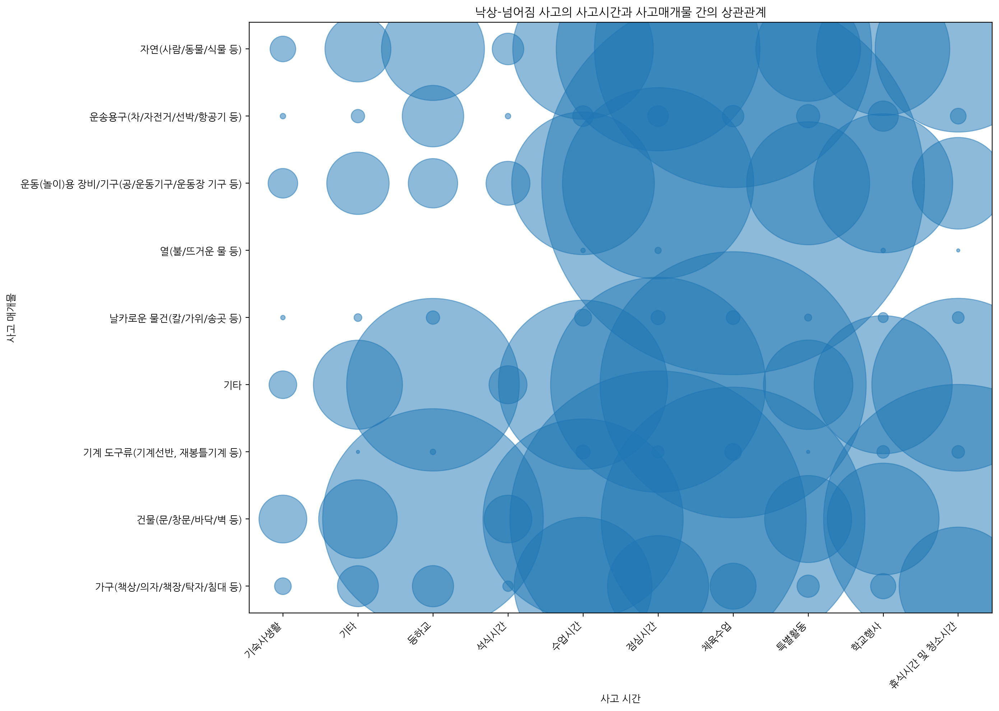

In [68]:
# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

# Filter the data where '사고형태' is '낙상-넘어짐'
falling_accidents = all_data[all_data['사고형태'] == '낙상-넘어짐']

# Create a crosstab of '사고시간' and '사고매개물'
crosstab = pd.crosstab(falling_accidents['사고시간'], falling_accidents['사고매개물'])

# Prepare data for bubble chart
bubble_data = crosstab.stack().reset_index().rename(columns={0: 'Count'})
bubble_data['Size'] = bubble_data['Count'] * 10  # Adjust size for better visualization

# Plot the bubble chart
plt.figure(figsize=(14, 10))
plt.scatter(bubble_data['사고시간'], bubble_data['사고매개물'], s=bubble_data['Size'], alpha=0.5)
plt.title('낙상-넘어짐 사고의 사고시간과 사고매개물 간의 상관관계')
plt.xlabel('사고 시간')
plt.ylabel('사고 매개물')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

              precision    recall  f1-score   support

           0       0.82      1.00      0.90    151178
           1       0.02      0.00      0.00     33739

    accuracy                           0.82    184917
   macro avg       0.42      0.50      0.45    184917
weighted avg       0.67      0.82      0.73    184917



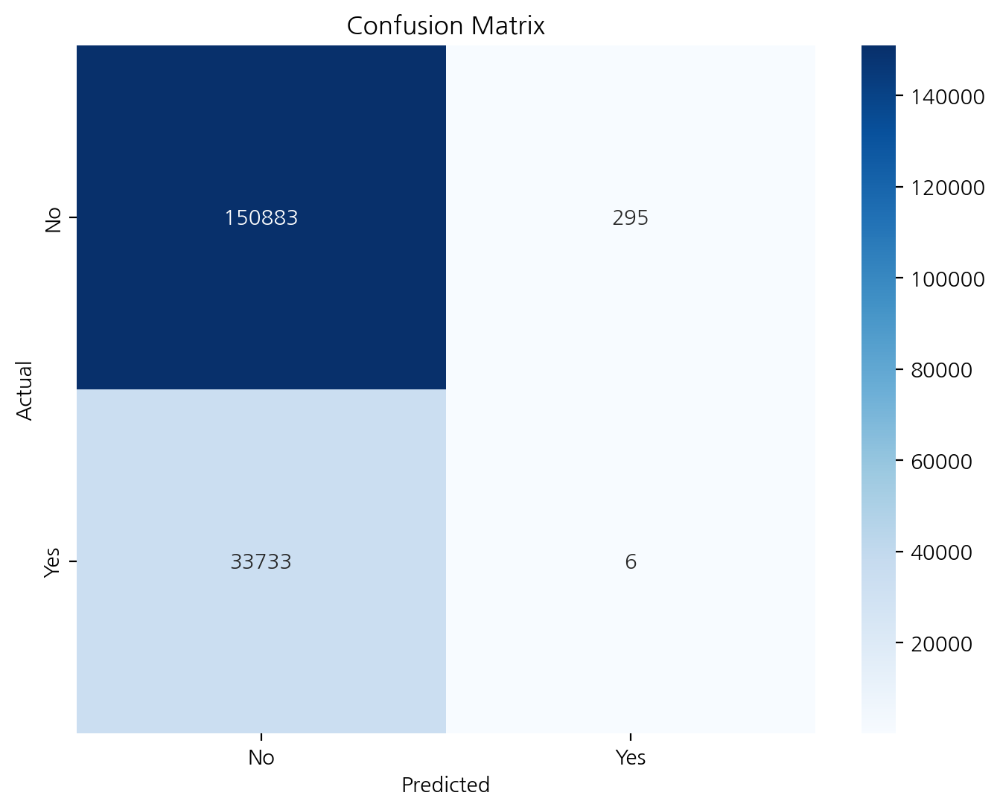

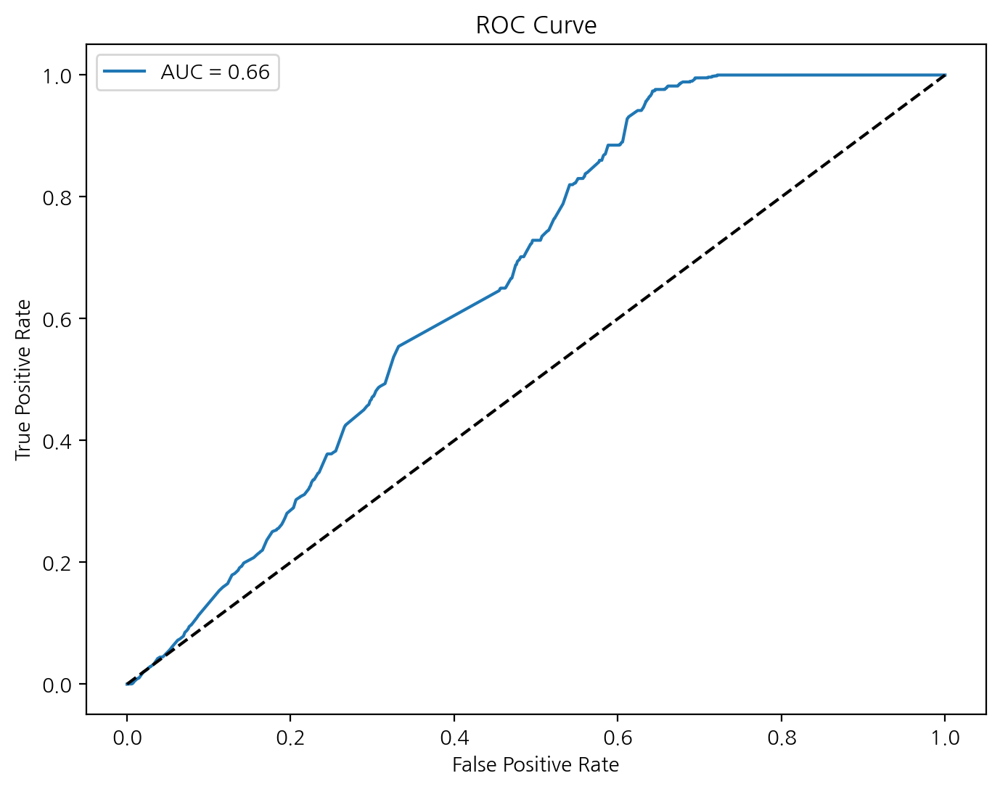

In [72]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score

# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

# Create a binary column for '낙상-넘어짐' (1 if '낙상-넘어짐', 0 otherwise)
all_data['낙상-넘어짐'] = all_data['사고형태'].apply(lambda x: 1 if x == '낙상-넘어짐' else 0)

# Convert categorical variables to numerical values
all_data['사고시간'] = pd.factorize(all_data['사고시간'])[0]
all_data['사고매개물'] = pd.factorize(all_data['사고매개물'])[0]
all_data['사고당시활동'] = pd.factorize(all_data['사고당시활동'])[0]

# Select relevant columns
X = all_data[['사고시간', '사고매개물', '사고당시활동']]
y = all_data['낙상-넘어짐']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create and train the logistic regression model
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train, y_train)

# Predict the test set results
y_pred = logreg.predict(X_test)

# Print the classification report
print(classification_report(y_test, y_pred))

# Plot the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['No', 'Yes'], yticklabels=['No', 'Yes'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

# Plot the ROC curve
y_pred_prob = logreg.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {roc_auc_score(y_test, y_pred_prob):.2f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

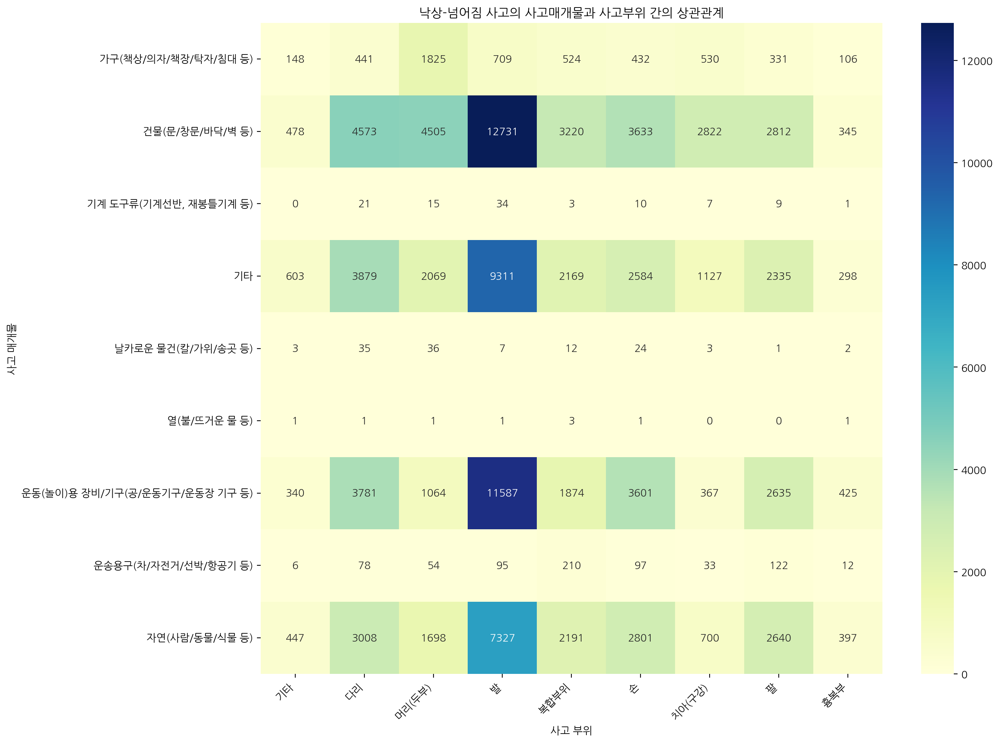

In [73]:
# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

# Filter the data where '사고형태' is '낙상-넘어짐'
falling_accidents = all_data[all_data['사고형태'] == '낙상-넘어짐']

# Create a crosstab of '사고매개물' and '사고부위'
crosstab = pd.crosstab(falling_accidents['사고매개물'], falling_accidents['사고부위'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('낙상-넘어짐 사고의 사고매개물과 사고부위 간의 상관관계')
plt.xlabel('사고 부위')
plt.ylabel('사고 매개물')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

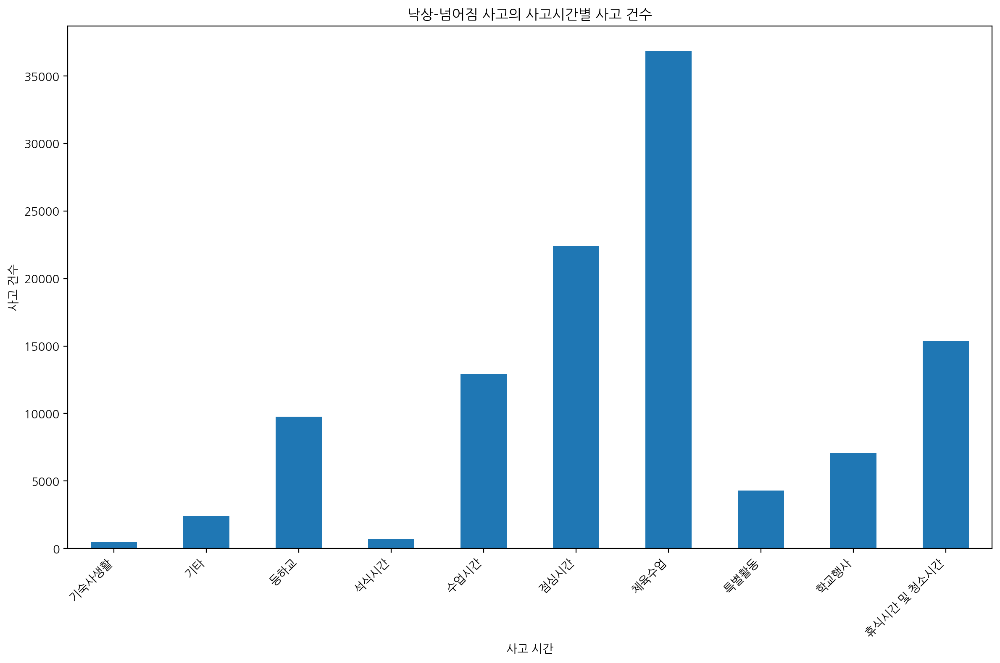

In [74]:
# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

# Filter the data where '사고형태' is '낙상-넘어짐'
falling_accidents = all_data[all_data['사고형태'] == '낙상-넘어짐']

# Count the number of accidents per '사고시간'
accident_time_counts = falling_accidents['사고시간'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_time_counts.plot(kind='bar')
plt.title('낙상-넘어짐 사고의 사고시간별 사고 건수')
plt.xlabel('사고 시간')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

In [75]:
# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

# Filter the data where '사고형태' is '사람과의 충돌'
collision_accidents = all_data[all_data['사고형태'] == '사람과의 충돌']

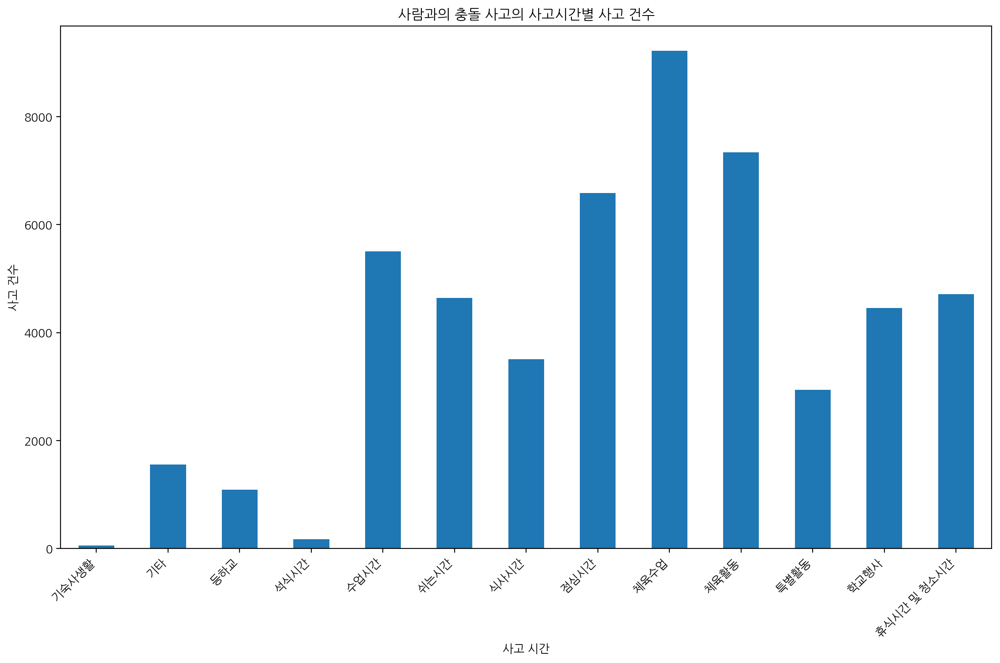

In [76]:
# Count the number of accidents per '사고시간'
accident_time_counts = collision_accidents['사고시간'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_time_counts.plot(kind='bar')
plt.title('사람과의 충돌 사고의 사고시간별 사고 건수')
plt.xlabel('사고 시간')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

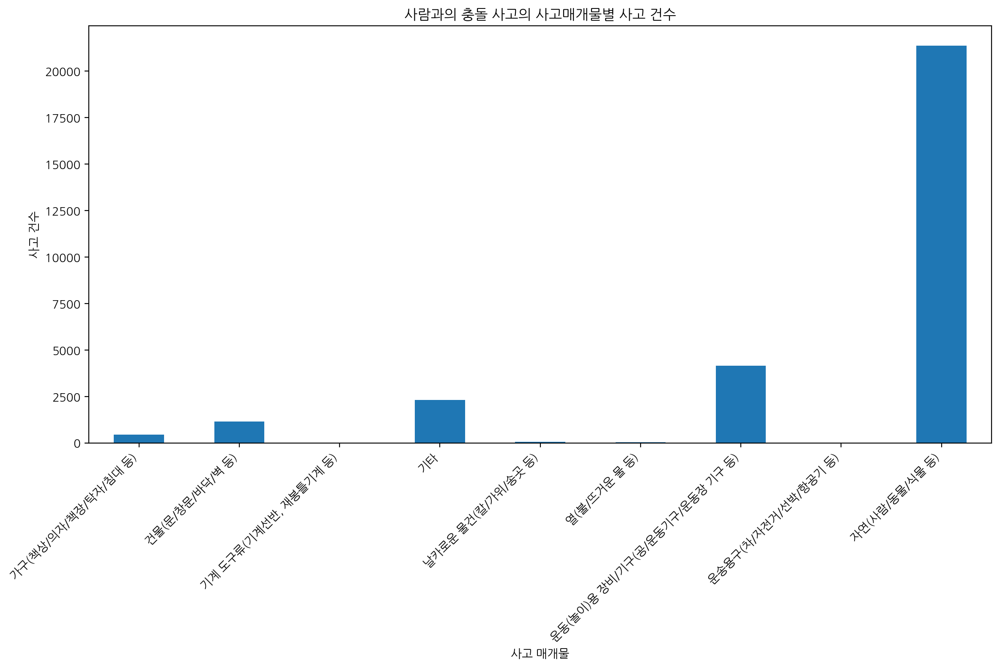

In [77]:
# Count the number of accidents per '사고매개물'
accident_medium_counts = collision_accidents['사고매개물'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_medium_counts.plot(kind='bar')
plt.title('사람과의 충돌 사고의 사고매개물별 사고 건수')
plt.xlabel('사고 매개물')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

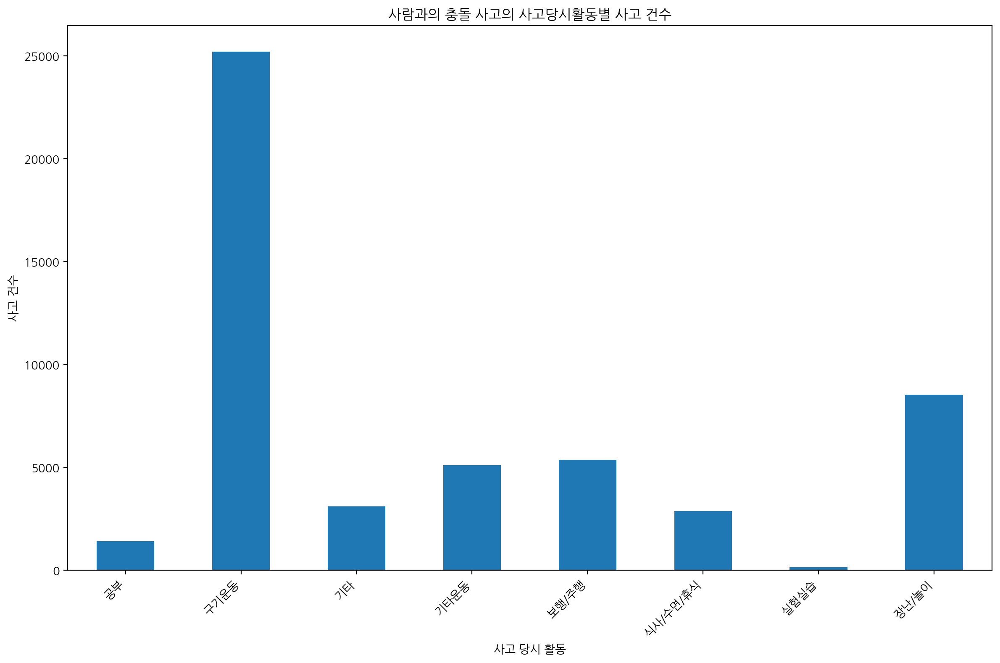

In [78]:
# Count the number of accidents per '사고당시활동'
accident_activity_counts = collision_accidents['사고당시활동'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_activity_counts.plot(kind='bar')
plt.title('사람과의 충돌 사고의 사고당시활동별 사고 건수')
plt.xlabel('사고 당시 활동')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

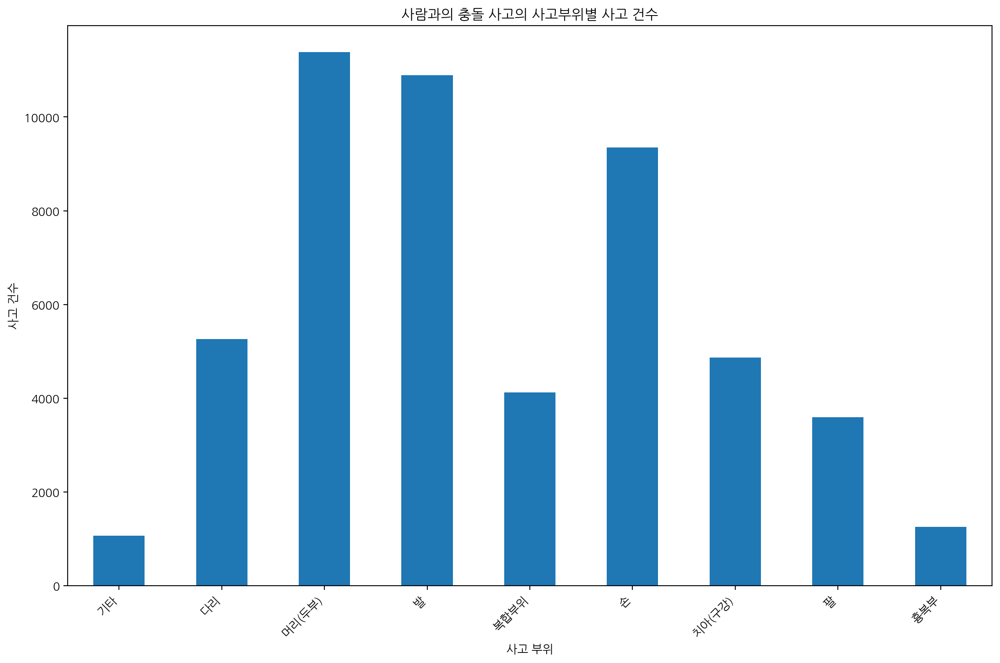

In [79]:
# Count the number of accidents per '사고부위'
accident_body_part_counts = collision_accidents['사고부위'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_body_part_counts.plot(kind='bar')
plt.title('사람과의 충돌 사고의 사고부위별 사고 건수')
plt.xlabel('사고 부위')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

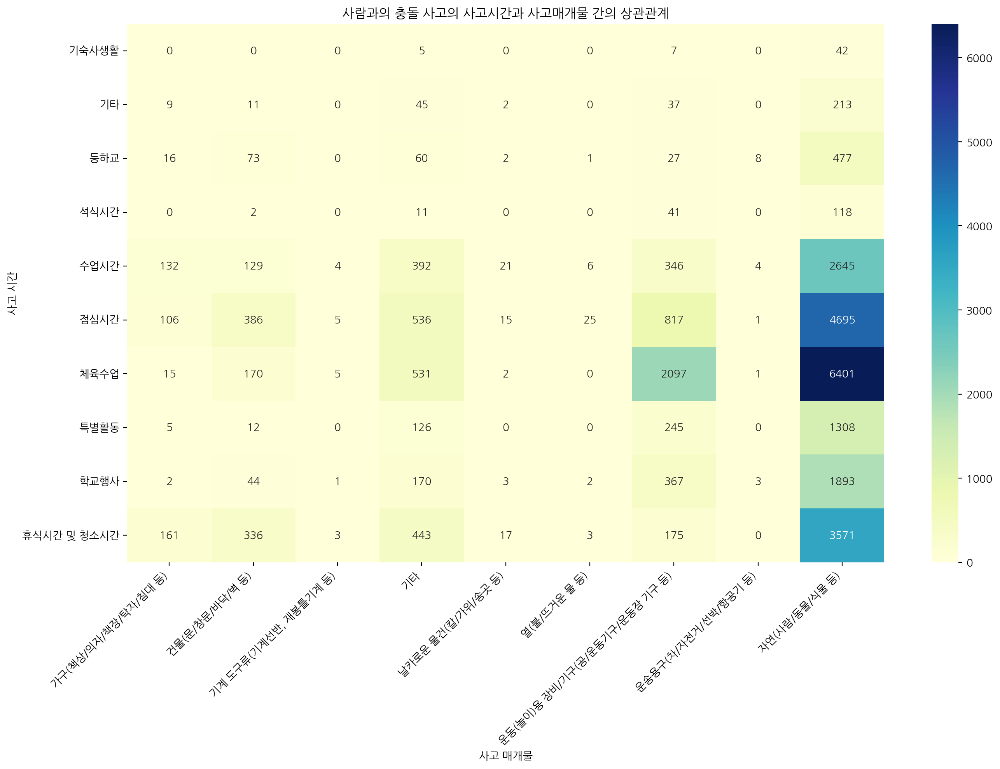

In [80]:
# Create a crosstab of '사고시간' and '사고매개물'
crosstab = pd.crosstab(collision_accidents['사고시간'], collision_accidents['사고매개물'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('사람과의 충돌 사고의 사고시간과 사고매개물 간의 상관관계')
plt.xlabel('사고 매개물')
plt.ylabel('사고 시간')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

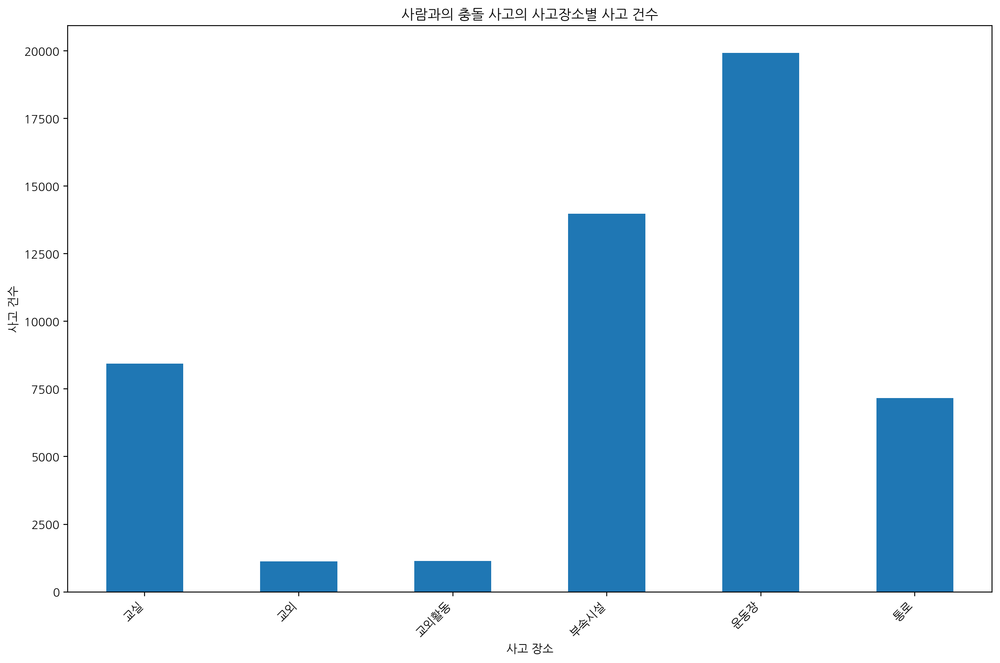

In [81]:
# Count the number of accidents per '사고장소'
accident_location_counts = collision_accidents['사고장소'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_location_counts.plot(kind='bar')
plt.title('사람과의 충돌 사고의 사고장소별 사고 건수')
plt.xlabel('사고 장소')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

In [82]:
# Filter for accidents in '부속시설'
facility_accidents = collision_accidents[collision_accidents['사고장소'] == '부속시설']

# Define a function to determine if the accident happened during lunchtime
def is_lunchtime(time):
    lunchtime_hours = [11, 12, 13]  # Define lunchtime hours
    if isinstance(time, str):
        try:
            hour = int(time.split(':')[0])
            return hour in lunchtime_hours
        except ValueError:
            return False
    return False

# Filter for accidents during lunchtime
facility_accidents['점심시간'] = facility_accidents['사고발생시각'].apply(is_lunchtime)
lunchtime_accidents = facility_accidents[facility_accidents['점심시간']]

<ipython-input-82-637297ba5e58>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  facility_accidents['점심시간'] = facility_accidents['사고발생시각'].apply(is_lunchtime)


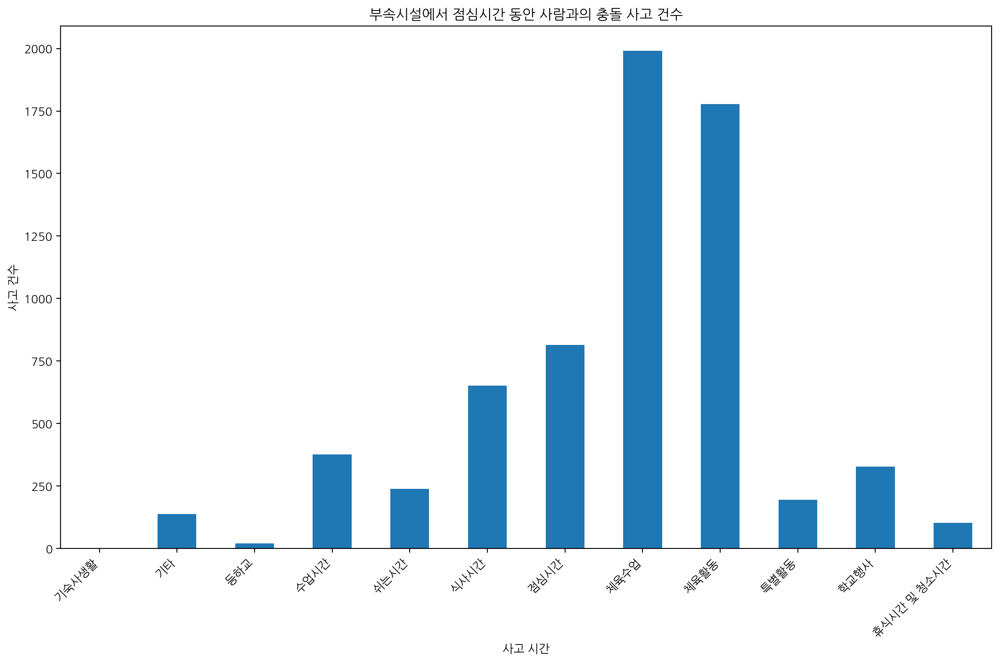

In [83]:
# Count the number of accidents during lunchtime in '부속시설'
lunchtime_accident_counts = lunchtime_accidents['사고시간'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(12, 8))
lunchtime_accident_counts.plot(kind='bar')
plt.title('부속시설에서 점심시간 동안 사람과의 충돌 사고 건수')
plt.xlabel('사고 시간')
plt.ylabel('사고 건수')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels and align them to the right
plt.tight_layout()

# Display the plot
plt.show()

<ipython-input-84-d117ce392bf5>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  facility_accidents['Hour'] = pd.to_datetime(facility_accidents['사고발생시각'], format='%H:%M').dt.hour


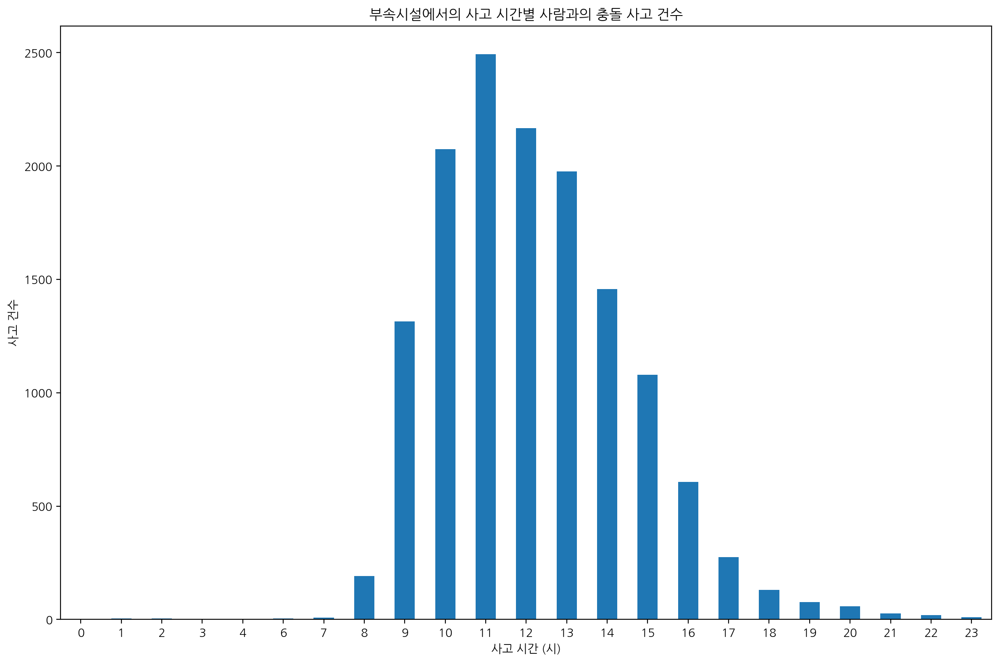

In [84]:
# Filter the data where '사고형태' is '사람과의 충돌'
collision_accidents = all_data[all_data['사고형태'] == '사람과의 충돌']

# Filter for accidents in '부속시설'
facility_accidents = collision_accidents[collision_accidents['사고장소'] == '부속시설']

# Extract hour from '사고발생시각'
facility_accidents['Hour'] = pd.to_datetime(facility_accidents['사고발생시각'], format='%H:%M').dt.hour

# Count the number of accidents per 'Hour'
accident_hour_counts = facility_accidents['Hour'].value_counts().sort_index()

# Plot the bar graph
plt.figure(figsize=(12, 8))
accident_hour_counts.plot(kind='bar')
plt.title('부속시설에서의 사고 시간별 사람과의 충돌 사고 건수')
plt.xlabel('사고 시간 (시)')
plt.ylabel('사고 건수')
plt.xticks(rotation=0)
plt.tight_layout()

# Display the plot
plt.show()

<ipython-input-85-22b2e4be8fb4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  collision_accidents['Hour'] = pd.to_datetime(collision_accidents['사고발생시각'], format='%H:%M').dt.hour


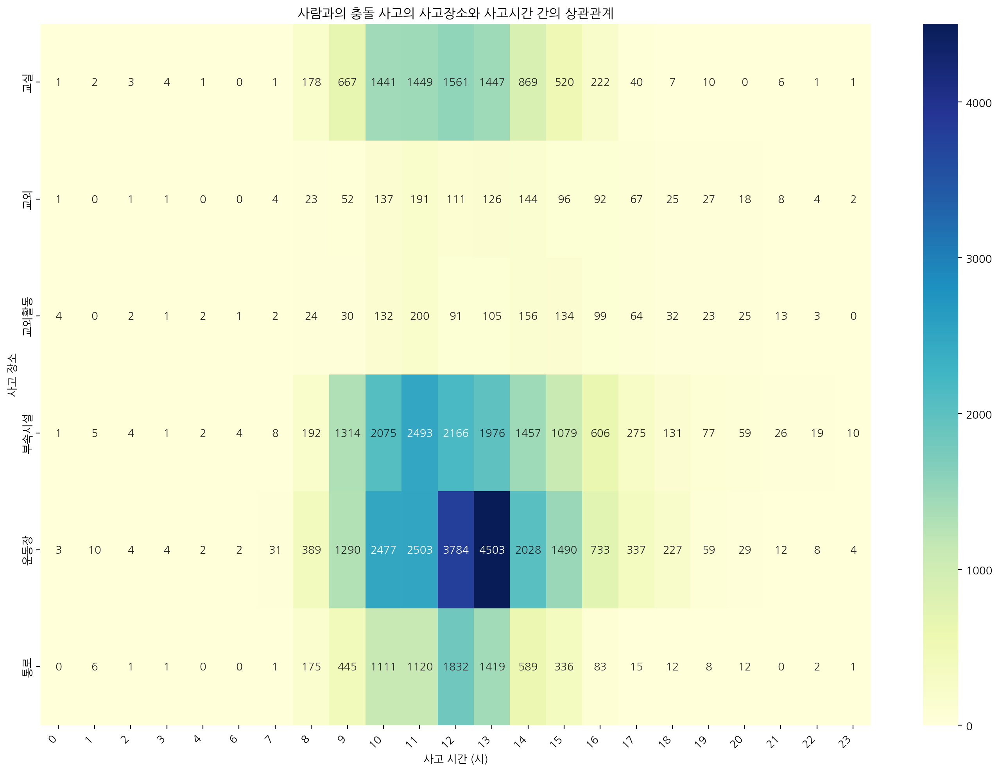

In [85]:
# Extract hour from '사고발생시각'
collision_accidents['Hour'] = pd.to_datetime(collision_accidents['사고발생시각'], format='%H:%M').dt.hour

# Create a crosstab of '사고장소' and 'Hour'
crosstab = pd.crosstab(collision_accidents['사고장소'], collision_accidents['Hour'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('사람과의 충돌 사고의 사고장소와 사고시간 간의 상관관계')
plt.xlabel('사고 시간 (시)')
plt.ylabel('사고 장소')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

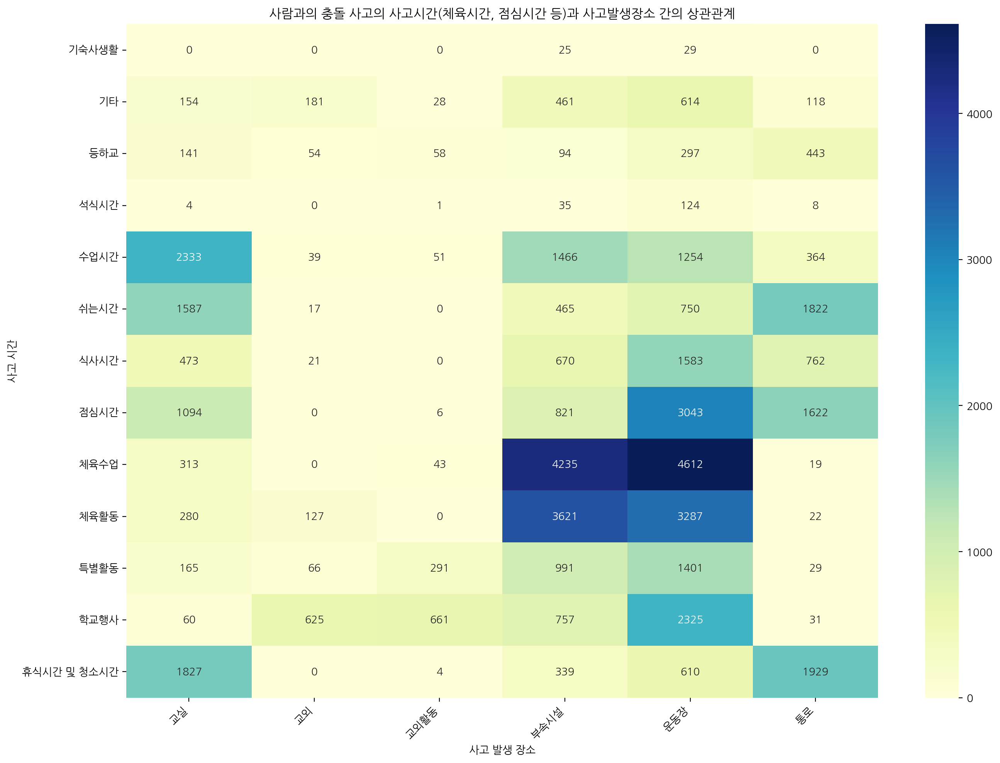

In [86]:
# Create a crosstab of '사고시간' and '사고장소'
crosstab = pd.crosstab(collision_accidents['사고시간'], collision_accidents['사고장소'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('사람과의 충돌 사고의 사고시간(체육시간, 점심시간 등)과 사고발생장소 간의 상관관계')
plt.xlabel('사고 발생 장소')
plt.ylabel('사고 시간')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

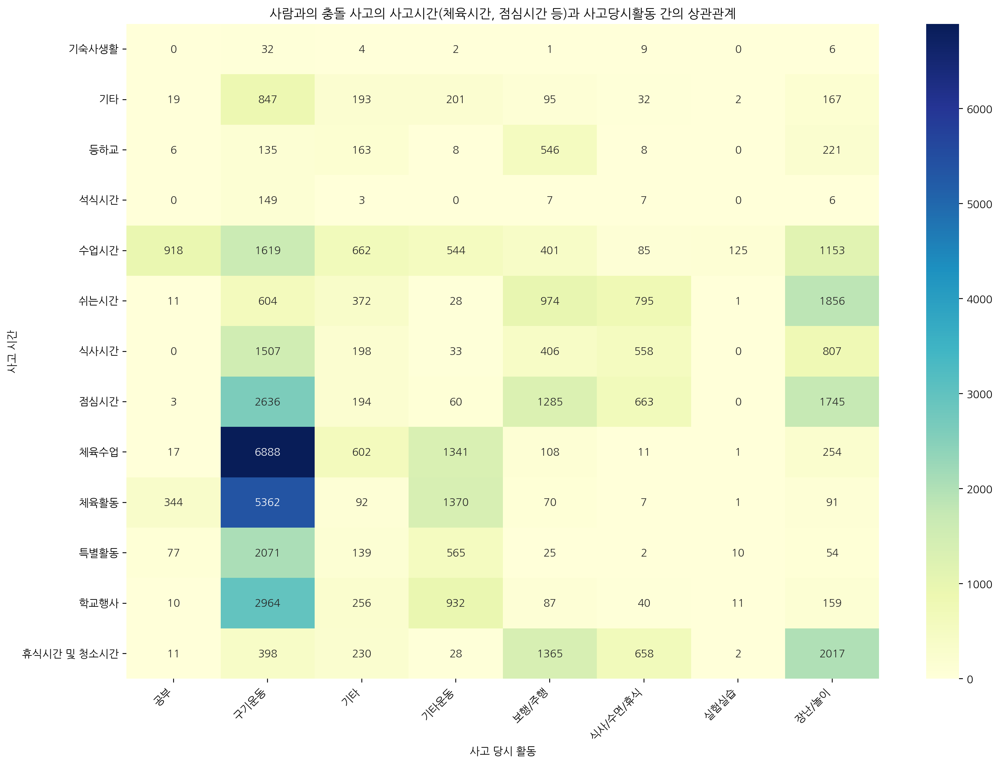

In [87]:
# Create a crosstab of '사고시간' and '사고당시활동'
crosstab = pd.crosstab(collision_accidents['사고시간'], collision_accidents['사고당시활동'])

# Plot the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title('사람과의 충돌 사고의 사고시간(체육시간, 점심시간 등)과 사고당시활동 간의 상관관계')
plt.xlabel('사고 당시 활동')
plt.ylabel('사고 시간')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

<ipython-input-88-d41773a82fd2>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  collision_accidents['Hour'] = pd.to_datetime(collision_accidents['사고발생시각'], format='%H:%M').dt.hour


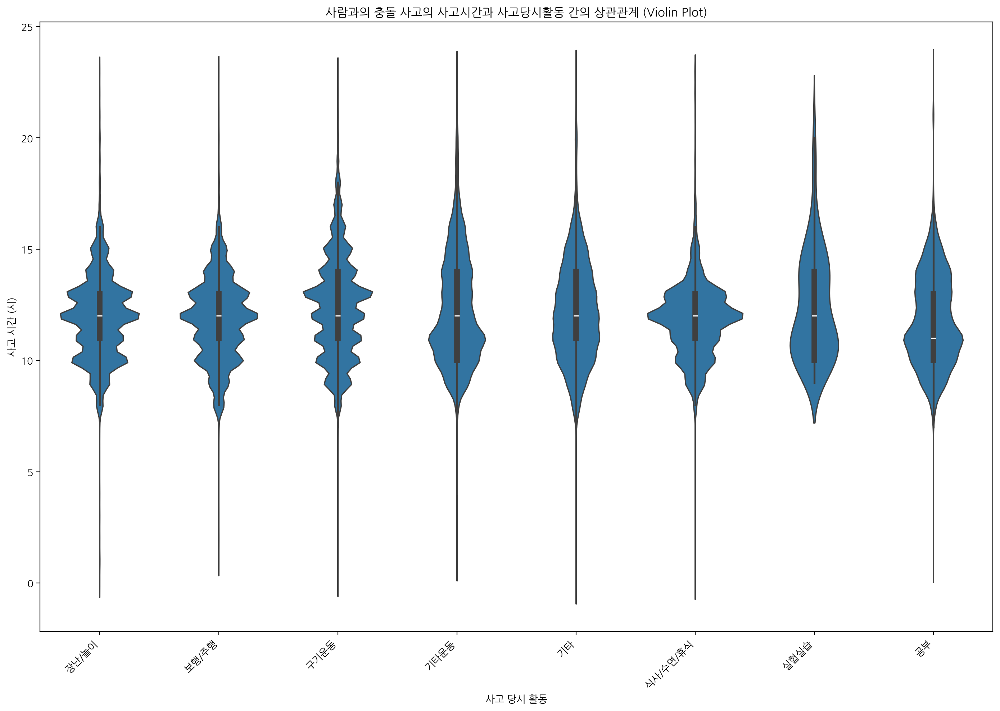

In [88]:
# Filter the data where '사고형태' is '사람과의 충돌'
collision_accidents = all_data[all_data['사고형태'] == '사람과의 충돌']

# Extract hour from '사고발생시각'
collision_accidents['Hour'] = pd.to_datetime(collision_accidents['사고발생시각'], format='%H:%M').dt.hour

# Plot the violin plot
plt.figure(figsize=(14, 10))
sns.violinplot(x='사고당시활동', y='Hour', data=collision_accidents)
plt.title('사람과의 충돌 사고의 사고시간과 사고당시활동 간의 상관관계 (Violin Plot)')
plt.xlabel('사고 당시 활동')
plt.ylabel('사고 시간 (시)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

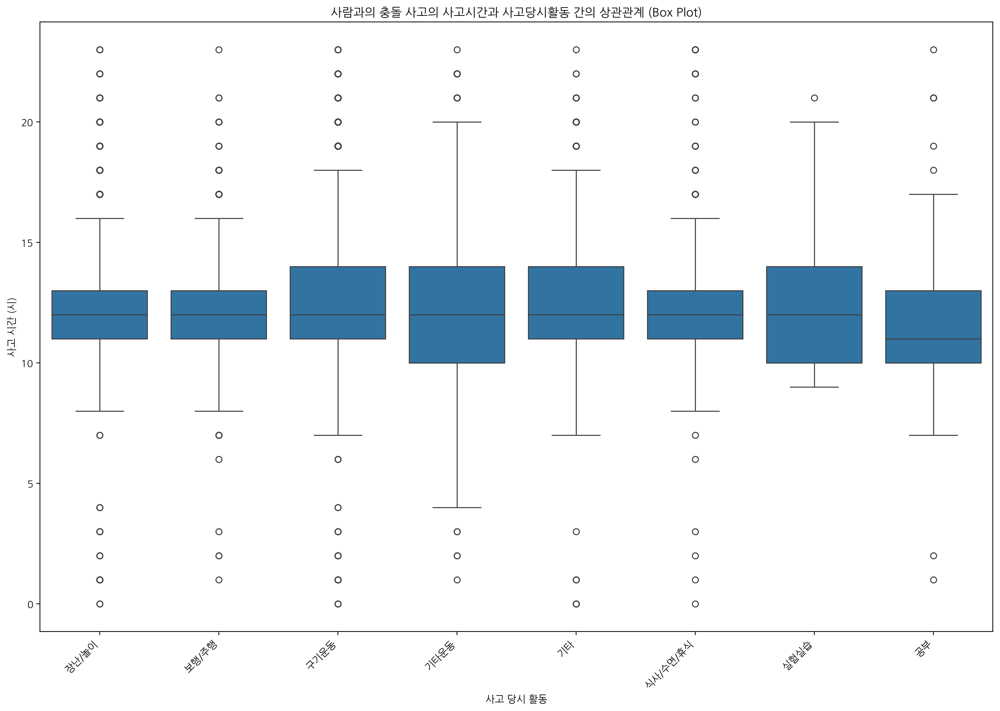

In [89]:
plt.figure(figsize=(14, 10))
sns.boxplot(x='사고당시활동', y='Hour', data=collision_accidents)
plt.title('사람과의 충돌 사고의 사고시간과 사고당시활동 간의 상관관계 (Box Plot)')
plt.xlabel('사고 당시 활동')
plt.ylabel('사고 시간 (시)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

In [90]:
# plt.figure(figsize=(14, 10))
# sns.swarmplot(x='사고당시활동', y='Hour', data=collision_accidents)
# plt.title('사람과의 충돌 사고의 사고시간과 사고당시활동 간의 상관관계 (Swarm Plot)')
# plt.xlabel('사고 당시 활동')
# plt.ylabel('사고 시간 (시)')
# plt.xticks(rotation=45, ha='right')
# plt.tight_layout()

# # Display the plot
# plt.show()

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7cd85ec9b130> (for post_execute):


KeyboardInterrupt: 

In [91]:
# plt.figure(figsize=(14, 10))
# sns.boxplot(x='사고당시활동', y='Hour', data=collision_accidents, whis=[0, 100], width=.6, palette="vlag")
# sns.swarmplot(x='사고당시활동', y='Hour', data=collision_accidents, size=4, color=".3", linewidth=0)
# plt.title('사람과의 충돌 사고의 사고시간과 사고당시활동 간의 상관관계 (Box + Swarm Plot)')
# plt.xlabel('사고 당시 활동')
# plt.ylabel('사고 시간 (시)')
# plt.xticks(rotation=45, ha='right')
# plt.tight_layout()

# # Display the plot
# plt.show()

<ipython-input-91-560537cc4e3b>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='사고당시활동', y='Hour', data=collision_accidents, whis=[0, 100], width=.6, palette="vlag")


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7cd85ec9b130> (for post_execute):


KeyboardInterrupt: 

<ipython-input-92-c49a3df9649d>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  collision_accidents['Hour'] = pd.to_datetime(collision_accidents['사고발생시각'], format='%H:%M').dt.hour


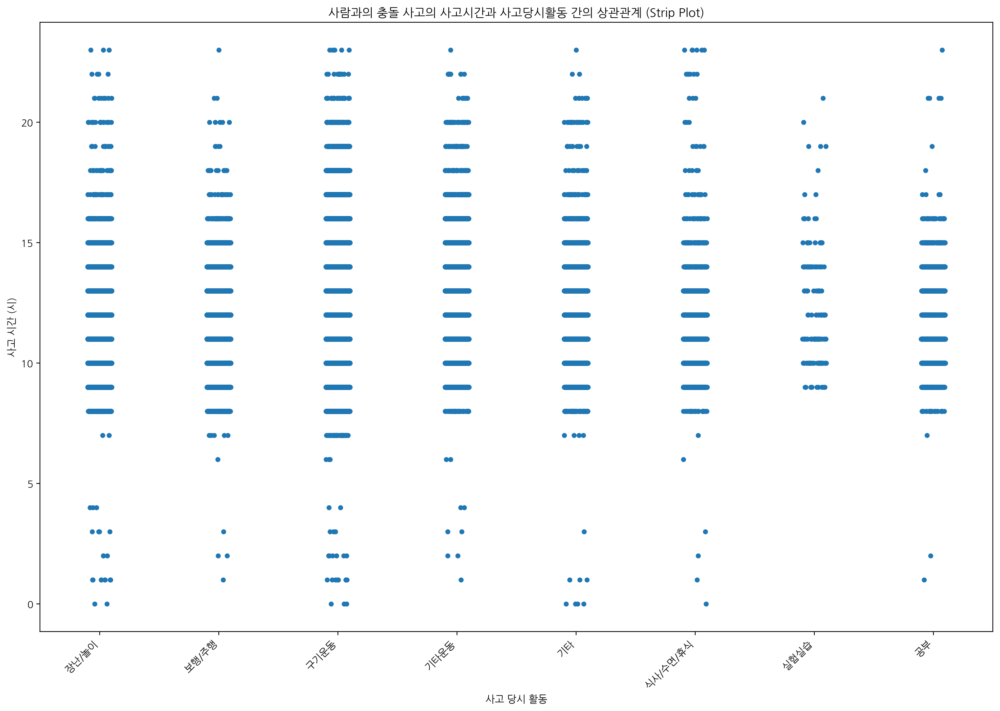

In [92]:
# Concatenate all data into one DataFrame
all_data = pd.concat([data_2019, data_2020, data_2021, data_2022, data_2023], ignore_index=True)

# Filter the data where '사고형태' is '사람과의 충돌'
collision_accidents = all_data[all_data['사고형태'] == '사람과의 충돌']

# Extract hour from '사고발생시각'
collision_accidents['Hour'] = pd.to_datetime(collision_accidents['사고발생시각'], format='%H:%M').dt.hour

# Plot the strip plot
plt.figure(figsize=(14, 10))
sns.stripplot(x='사고당시활동', y='Hour', data=collision_accidents, jitter=True)
plt.title('사람과의 충돌 사고의 사고시간과 사고당시활동 간의 상관관계 (Strip Plot)')
plt.xlabel('사고 당시 활동')
plt.ylabel('사고 시간 (시)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

<ipython-input-93-ff144545ee94>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  collision_accidents['Hour'] = pd.to_datetime(collision_accidents['사고발생시각'], format='%H:%M').dt.hour
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 36.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 5.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 71.0% of the points cannot be placed; you may want t

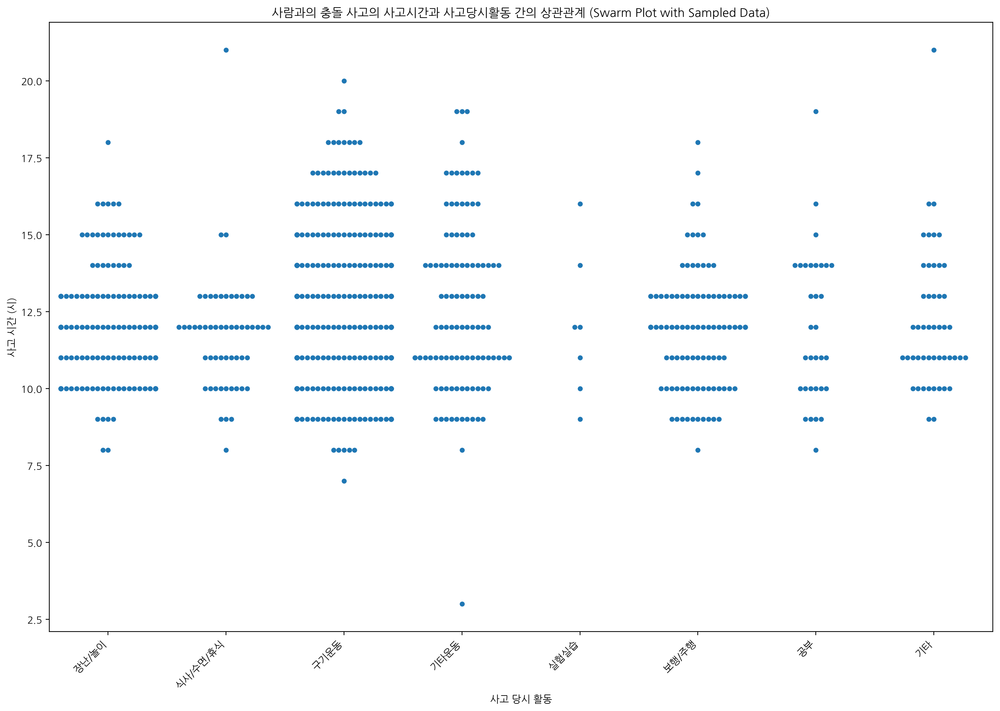

In [93]:
# Filter the data where '사고형태' is '사람과의 충돌'
collision_accidents = all_data[all_data['사고형태'] == '사람과의 충돌']

# Extract hour from '사고발생시각'
collision_accidents['Hour'] = pd.to_datetime(collision_accidents['사고발생시각'], format='%H:%M').dt.hour

# Sample the data (for example, 1000 samples)
sampled_data = collision_accidents.sample(n=1000, random_state=42)

# Plot the swarm plot with sampled data
plt.figure(figsize=(14, 10))
sns.swarmplot(x='사고당시활동', y='Hour', data=sampled_data)
plt.title('사람과의 충돌 사고의 사고시간과 사고당시활동 간의 상관관계 (Swarm Plot with Sampled Data)')
plt.xlabel('사고 당시 활동')
plt.ylabel('사고 시간 (시)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()